In [1]:
import pandas as pd
import seaborn as sns
import scipy
from matplotlib import pyplot as plt
from PIL import Image
import numpy as np
import pandas as pd
#import pybel

from rdkit import Chem
from rdkit.Chem import PandasTools
from rdkit.Chem.Lipinski import NumHDonors, NumHAcceptors, NumAromaticRings
import rdkit.Chem as Chem
from rdkit import DataStructs
from rdkit.Chem import AllChem
from rdkit.Chem.Crippen import MolLogP

import sys
sys.path.append('../')


%matplotlib inline

In [2]:
smiles = pd.read_csv('./chemgraph/SMILES.csv').values
print(smiles.shape)

smilessan = []
    
    

(59999, 4)


In [3]:
smiles = smiles[smiles[:,1].argsort()]

In [4]:
print(smiles[0])

[-6.100000858306885 1.2227091789245603
 'N=C=C(N)Cc1c(Cl)cc(Cl)c(N(c2cc(O)nc(O)n2)C(CCl)CCl)c1F'
 0.2150816470384597]


In [5]:
smilesmols = []
smilesCNS = []
smilesVINA = []

count = 0
for i in range(smiles.shape[0]):
    if(smiles[i,1] > 5 and smiles[i,0] < -5):
        count += 1
        flag = Chem.SanitizeMol(Chem.MolFromSmiles(smiles[i,2]), catchErrors=True)
        if flag == Chem.SanitizeFlags.SANITIZE_NONE:
            smilesmols.append(Chem.MolFromSmiles(smiles[i,2]))
            smilesCNS.append(smiles[i,1])
            smilesVINA.append(smiles[i,0])

print(count)
print(len(smilesmols))

40275
40275


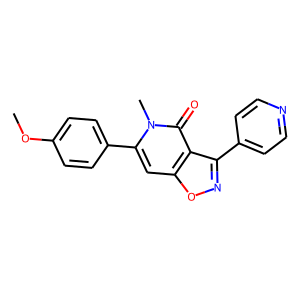

In [2]:
Chem.Draw.MolToImage(Chem.MolFromSmiles("CN1C(=CC2=C(C1=O)C(=NO2)C3=CC=NC=C3)C4=CC=C(C=C4)OC"))

In [25]:
Chem.Draw.MolsToGridImage(smilesmols, molsPerRow=30, subImgSize=[300, 300], legends=legends, maxMols=1000)

In [7]:
from SA_Score.sascorer import scoreMolecules

SAscores = scoreMolecules(smilesmols)

smiles	sa_score
Cc1nc2c3c(n1)N(C(C)CC=CN)c1ccc(cc1C3)O2	4.994877
CCN(COS)c1nc(O)nc(O)c1Cc1ccccc1	3.142305
Cc1nc(N(C)F)c2c(n1)C(C)(NS)c1c(C)cccc1C2	4.175926
C=CC1C(=C)c2cc3cc4c2n1c1ncnc(o3)c1-c-4=C1C(Cl)=C=NC(Cl)=CC1=CCl	6.186116
CCN1c2nc(S)nc3c2Cc2cccc(c21)O3	4.571589
Cc1c2cc(S)cc1C(Cl)c1c(NC(O)C=S)ncnc1O2	5.418631
CCc1cccc2c1N1c3ncnc(c3C=CC2)C1C	4.579974
Oc1ncnc2c1C1=C3C(CC(F)C3c3ccc(S)c1c3)N2	5.467601
CCN1c2ccc(C)cc2Cc2cncnc21	2.536016
CCCN1c2ccccc2Cc2cncnc21	2.423782
CC1(F)C2=NC(=N)c3c(F)cc(Cl)c4c3N1c1ncncc1C4(N=N)OC2=O	6.009418
CC(N)N1c2ncnc3c2C(N)(OCl)c2cccc(c21)O3	5.680494
CC1(CF)Oc2nc(nc3c2C2=CC4(F)Cc5cccc2c5N34)C1=O	5.967565
CC1c2cc(O)c3c(c2)N1c1nc2nc(OCl)c1C3(C)S2	6.201072
CC1c2cc(O)c3c(c2)N1c1nc2nc(OCl)c1C3(C)S2	6.201072
C1=COc2c3ccc4c2COc2nc5nc(c2C=13)NC(=C4)C1(CSOO1)S5	7.928293
CC(Cl)C1=C2CCC(C2)N1c1cc(ON)nc(Cl)n1	5.174551
C=c1-c2c3nc4nc2n(c2c-1ccc(o3)c2CC)CCCS4	5.188270
CC1=C2CC3=C1C(O)=C(Cl)N(c1nc(F)nc(O)c1C=O)C2=C3	5.215654
CC1=C2CC3=C1C(O)=C(Cl)N(c1nc(F)nc(O)c1C=O)C2=C3

O=NN=C=Nc1cc2c(cc1OS)CN1c3ncnc(c3C2)OC1(COF)NF	6.192453
CC(=N)N(c1ccncn1)c1c(C(O)=S)cc(SCl)c(SS)c1C=CO	4.373093
CN(C=CO)C1(O)C=C2c3cc4c(cc3CN2O)C2=CC1N4c1ncncc12	6.111529
Oc1ncnc(NC(F)C#[SH])c1Cc1cccc(Cl)c1	3.706925
FC#CC1(F)CC(=c2-c3c4ncnc3n3c5c-2cc(o4)c(c5F)C(Cl)C3F)ON=N1	6.798529
CN=CCCn1c2ncnc3oc4cc(N)c1c(c4)-c(=CO)-c32	4.996144
CN=CCCn1c2ncnc3oc4cc(N)c1c(c4)-c(=CO)-c32	4.996144
CC(CCl)c1cc2c(N)c(F)c1N(c1ccncn1)C2(O)C=N	5.204891
Cc1c2oc3ncnc4c3c(=S)c3cc2C(C(C)O)n4c13	5.649888
OCCN1c2ncnc3c2Cc2c(O)ccc(c21)C(S)O3	5.219570
CC1c2ccc3cc2n(CCS)c2nc(N=N)nc(o3)c21	5.834178
Cc1c(C2(F)SCNc3ncnc(OC=S)c32)cc(O)c(CF)c1F	4.767691
C=C1c2cc(F)cc3c2N2c4nc(nc(OS)c41)C=CC2(Cl)C3S	5.961025
CCC(F)c1cc(N)cc2c1C(C=O)c1c(S)ncnc1N2	4.464295
OSC(F)SC12CC3(F)COc4cc5c(c3c4F)Cc3c(ncnc3N51)O2	6.829853
C=C(F)C(=O)N1c2ccccc2C(F)(S)c2cnc(C)nc21	3.887645
O=NOc1nc(S)nc2c1c1c(S)n2c2cc(Cl)c(Cl)cc12	4.579291
COc1nc(C)nc(N)c1Cc1c2ccc(C)c1CC=C2	3.768932
Cc1c2c3c4c(F)c1C(S)(C(=O)F)N4c1ncnc(c1C3F)O2	5.903042
Cc1cc(N)c2c(c1

CCN1c2ccccc2Cc2cncnc21	2.446239
CCN1c2ccccc2Cc2cncnc21	2.446239
CCN1c2ccccc2Cc2cncnc21	2.446239
CCN1c2ccccc2Cc2cncnc21	2.446239
CCN1c2ccccc2Cc2cncnc21	2.446239
CCN1c2ccccc2Cc2cncnc21	2.446239
CCN1c2ccccc2Cc2cncnc21	2.446239
CCN1c2ccccc2Cc2cncnc21	2.446239
CCN1c2ccccc2Cc2cncnc21	2.446239
CCN1c2ccccc2Cc2cncnc21	2.446239
CCN1c2ccccc2Cc2cncnc21	2.446239
CCN1c2ccccc2Cc2cncnc21	2.446239
CCN1c2ccccc2Cc2cncnc21	2.446239
CCN1c2ccccc2Cc2cncnc21	2.446239
CCN1c2ccccc2Cc2cncnc21	2.446239
CCN1c2ccccc2Cc2cncnc21	2.446239
CCN1c2ccccc2Cc2cncnc21	2.446239
Oc1ncnc2c1C(F)c1c3cc(S)c(c1F)CC(NS)N32	6.056323
CN1c2cc(F)cc3c2C(=[SH])N=CC3c2c(O)nc(Cl)nc21	5.291764
Cc1c(N)cc2c(c1F)N1c3ncnc(c3C2)OC1CC=N	5.307814
C=C1CSc2cc(cc(O)c2N)N1C1=NC2=NC(OC#N)=C1C2OC	5.743346
CC1OC2=NC3c4c5nc6nc4N4c7c1ccc(c73)C24CC6O5	7.168270
CC1SOc2ncnc3c2C(CC2=C(N)C=C1C2=O)C(=O)CN3	6.100724
CC1=C=C2C(N1)Nc1ccc3c(c1)N2c1ncnc2c1C3(F)OCO2	5.930164
C=C1N=NC2(C)c3cc(ccc3Nc3ncnc(O)c32)C1(F)S	5.458038
C=C1OC2C3=COc4ncnc(c4C1O3)N2c1ccc(ON)cc1	5.5

NC1CN2c3nc(Cl)nc4c3Cc3c1ccc(c32)CO4	5.316606
CCc1c(F)c(OF)cc2c1Nc1ncnc3c1C2(S)CC(CCl)O3	4.861318
N=CCCCc1c(O)ncnc1Nc1ccccc1	2.729310
N=C1OC2(N)Oc3cc(ncn3)N(C2=O)c2cc(F)ccc21	5.108568
Fc1cccc2c1C1(OS)C#CNNC2c2cncnc2N1	5.872066
Cc1c2cc3c4c1Cc1cncnc1N4CCC3S2	4.645282
Oc1cccc2c1N1CCOC2c2cnc(S)nc21	4.566221
C=c1sc2c3cc(C#[SH])nnc4c3oc3ncnc5c3c3c4c2n5c13	5.670173
CC=C1c2ccccc2Nc2nc(O)nc(O)c21	3.105261
CC(=NO)N(c1ccncn1)c1c(C=CO)c(SS)c(SCl)c2c1C(=S)OC2	4.609659
C=C(F)C(F)N1c2ccccc2C(N)c2c(OCl)ncnc21	4.323623
Cc1ccc(N)c2c1Cc1c(O)ncnc1N2C(=S)CO	3.534025
Fc1cc(Cc2c3ncnc2OCCN3)cc(F)c1Cl	3.777278
Cc1cc(SNSO)c2c(c1)N(CC=N)c1ncnc(O)c1C2	4.216588
CSc1c2cc3c(c1OS)C(S2)c1cncnc1N3CC=NN	5.688150
CSc1c2cc3c(c1OS)C(S2)c1cncnc1N3CC=NN	5.688150
CCC(=S)c1c(S)cc2c(c1S)C(S)(C#N)c1c(ncnc1OCl)N2	4.948379
C#CC1(C)C=C=Cc2c(N=C=C=C)ccc3c2N1c1nc(C)ncc1C3	5.092540
C=C1c2cnc(F)nc2N(CCCl)c2c(C)c(F)cc(OCl)c21	3.749050
CC1c2ccc3c(c2)c(=S)c2c(OOO)ncnc2n3C1O	5.296287
S=c1c2cc3c4c(Cl)c2n(c2ncnc(OOCl)c12)C4(C(Cl)=NCl)NO3	5.85

SC=C1N2c3ncnc4c3C(N=CCl)c3c5ccc(c32)C1(N=C5)O4	7.188770
Fc1c2c3cc4c1Sc1nc(c5c(n1)N(C=C2)N(OS)C45)O3	7.071683
CC(S)(S)C1Cc2occc3c(S)c4cc5c3-c2-c2c(ncnc2n51)o4	6.229960
FOc1nc(Cl)nc2c1C1c3cccc4c3N2C1(F)C(CCl)=N4	5.802753
C=C1c2cc(N)c(O)c3c2N(CC)c2ncnc(c21)OC3	4.816990
CCN1c2ncnc(O)c2Cc2c(Cl)ccc(Cl)c21	3.053191
Cc1cc2c3c4c1C(N=COSS)CN3c1ncnc(c1C2)O4	6.156277
Cc1ccc(F)cc1N(C(=S)CC=N)c1cc(O)ncn1	3.496277
Cc1nc(O)c2c(n1)N(CC(=N)O)c1ccccc1C2	3.020132
CC#CC(C)c1nc2c(c(OS)n1)C(C)(O)c1ccc(cc1)N2	5.380311
CCc1c(Cl)c(Cl)c2c(c1N=O)C1=NCCN2c2ncnc(OO)c21	4.538584
CC1CNc2cc(S)c1cc2Cc1ncccn1	4.359204
CC1CNc2cc(S)c1cc2Cc1ncccn1	4.359204
CC1CNc2cc(S)c1cc2Cc1ncccn1	4.359204
CC1CNc2cc(S)c1cc2Cc1ncccn1	4.359204
CC1CNc2cc(S)c1cc2Cc1ncccn1	4.359204
C=C1c2cccc3c2N(C(C)N)c2nc(nc(O)c21)C3	5.075394
Fc1ccc(N2c3nc(F)nc(OCl)c3CN(F)OC2OCl)cc1	4.386681
C=C1c2cc3c(O)cc2N(c2ncnc(O)c21)C3C	4.954955
C#CC(C)N1c2cccc(C)c2C(S)c2c(O)ncnc21	4.336536
Cc1ccc2c(c1)C1CC(C)(C)N2c2ncnc(O)c21	4.219285
CCn1c2cc(Cl)cc(N=O)c2c(=N)c2c(OO

OOC1Cc2c3cc4c(c2OOOS1)OC3C1OC2=C3CC(=N2)N=C3N41	7.211374
C=C1c2ccccc2N2CC(F)(Cl)c3nc(O)c1c2n3	4.644431
C=C1c2ccccc2N2CC(F)(Cl)c3nc(O)c1c2n3	4.644431
C=C1c2ccccc2N2CC(F)(Cl)c3nc(O)c1c2n3	4.644431
C=CC1=CC(=O)Nc2ncnc3c2C1c1cc(C)ccc1O3	3.787053
CCc1cccc(Cc2c3ncnc2N(C(C)=CS)OOO3)c1	4.385754
C=C1c2ccc(N)c3c2N(c2ncnc(OO)c21)C(C)C3	4.071048
C=C1c2ccc(N)c3c2N(c2ncnc(OO)c21)C(C)C3	4.071048
C=C1c2ccc(N)c3c2N(c2ncnc(OO)c21)C(C)C3	4.071048
CC1CNc2cc(S)c1cc2Cc1cncnc1O	4.683353
Sc1nc2c3c(n1)N1C=C4NC35OC(=Cc3cc4cc1c35)O2	6.924838
CC1=c2sc3cc(F)cc(c3)n(c3nc(F)nc(OCl)c23)C1C(S)=NCl	5.988420
CC1Sc2cc3cc4c2N1c1nc(OCOC=C=N)nc(c1C4)O3	5.746419
CC1Sc2cc3cc4c2N1c1nc(OCOC=C=N)nc(c1C4)O3	5.746419
N=Cc1cc2oc3ncnc4c3c3cc(=N)n4c1c3c2Cl	5.093625
FN=CSC1(F)C2=COc3cc(ncn3)N1c1c(CSF)c3cc(c1s3)O2	6.663485
CN1c2nc3nc(c2Cc2c4ccc(c21)SS4)ONC(=O)C3	5.336786
Cc1c(S)ncnc1N1c2cccc(c2)C1CF	4.354437
C=NC(C)C(O)Nc1ccc2cc1Cc1cncnc1O2	5.193218
C=NC(C)C(O)Nc1ccc2cc1Cc1cncnc1O2	5.193218
CC1Cc2cc3ccc2N1c1ncnc(c1C(S)=CC=S)O3	5.891456

CC(Cl)C1OOc2ccc3c(c2N2c4cc(ncn4)OC(=C3)C2C)CN1Cl	6.657716
Clc1cc2oc3cc(ncn3)n3c(c1C(Cl)Cl)c2NOOCC3	5.586901
C=C1c2ccccc2N(C(=S)CC)c2ncncc21	3.080923
C=c1c(=O)c2nc3c4c(n2)n1-c1c(cccc1C4(C)C=O)O3	5.600156
CC1(F)Oc2ncnc3c2Cc2cc(S)ccc2N3C1=C(F)Cl	5.298742
Oc1ncnc2c1Cc1cc(Cl)c(Cl)cc1N2CCF	3.075930
Oc1c2oc3nc4c#cc5c6c(c(CCSF)c2F)c1n5c(n4)c36	6.332997
Fc1ncncc1C1CCCNc2ccccc21	3.128926
CCCCC(F)=C=c1-c2c3ncnc2n2c4c(cc(cc4-1)o3)CC2	4.885975
CCCCC(F)=C=c1-c2c3ncnc2n2c4c(cc(cc4-1)o3)CC2	4.885975
C=C1c2cc(F)cc(CCl)c2N(CC)c2ncnc(O)c21	3.363442
C=C1c2c3ncnc2n2c4c1cc(C)c(o3)c4NC(F)(S)CC2	5.859650
C=C1CSc2ccc3c(c2CC)N1c1ncnc2c1C3(C=S)C#CO2	5.755484
N=C1Cc2ccc3c(c2C1)Nc1nc(F)nc(O)c1C3	3.856781
Oc1nc2nc3c1Cc1c(F)cccc1N3CCC2	3.809445
CCNc1ncnc(O)c1C(O)c1ccccc1	2.892066
CCNc1ncnc(O)c1C(O)c1ccccc1	2.892066
CC(F)C(C)C(N)N1c2ccc3cc2Cc2c(ncnc21)O3	5.394443
CC(F)C(C)C(N)N1c2ccc3cc2Cc2c(ncnc21)O3	5.394443
Cc1ccc2c3c1Cc1cnc(nc1N3CC(O)(S)CO)CC2	5.088239
Cc1ccc2c3c1Cc1cnc(nc1N3CC(O)(S)CO)CC2	5.088239
Oc1cc(SCl)cc2c

C=C(C)C=C=CCCN1c2ccc3cc2Cc2c(ncnc21)O3	4.675504
C=C(C)C=C=CCCN1c2ccc3cc2Cc2c(ncnc21)O3	4.675504
C=C(C)C=C=CCCN1c2ccc3cc2Cc2c(ncnc21)O3	4.675504
C=C(C)C=C=CCCN1c2ccc3cc2Cc2c(ncnc21)O3	4.675504
C=C(C)C=C=CCCN1c2ccc3cc2Cc2c(ncnc21)O3	4.675504
C=C(C)C=C=CCCN1c2ccc3cc2Cc2c(ncnc21)O3	4.675504
C=C(C)C=C=CCCN1c2ccc3cc2Cc2c(ncnc21)O3	4.675504
CCNC12Nc3ncncc3Cc3c(cc(C)cc31)C2S	5.490918
C=CN1c2ccccc2C(C)Sc2c(OCl)ncnc21	4.027709
OC1C=C2Cc3c4oc5nc(C6=CN=NC6)nc6c5Cc(cc41)c3n62	6.431180
CC=c1-c2cc(C)c3cc2n(C(C)C#CF)c2ncnc(o3)c2-1	5.664219
C=CCc1cc2c(C)ccc3c2n1-c1ncnc(O)c1C3	3.360323
CC(CC=N)N1c2cc(F)ccc2Cc2c(O)ncnc21	3.862779
Oc1ncncc1Cc1cccc2c1NCC2	2.893721
Cc1c(O)ncnc1N1CC(O)(CNF)c2cccc1c2	4.606964
O=C1C2CCc3ncncc3C1(c1ccc(S)c(F)c1)SON(Cl)C2=S	5.524824
Cc1nc(OO)c2c(n1)N1CC=C2c2c(O)cccc21	4.074963
CCN1c2nc(F)nc(O)c2C(C#[SH])c2cccc(Cl)c21	4.080667
N=c1c2ooc3nc4nc5c3C(Cl)(C4)c3cc(ccc3-n15)N=2	6.684533
CCN1c2ncncc2Cc2c(C)ccc(C)c21	2.829022
CCN1c2ncncc2Cc2c(C)ccc(C)c21	2.829022
CCN1c2ncncc2Cc2c(C)ccc(C)

C=NC1CCc2ccc(C)c3c2N1c1nc2nc(c1C3)OC2	5.119853
C=NC1CCc2ccc(C)c3c2N1c1nc2nc(c1C3)OC2	5.119853
COOC12NC(F)C=C3CSc4nc5oc6ccc1c(c6C)n3c(n4)c52	6.780608
Cc1cc(F)c2c(c1)C(C)c1c3ncnc1N2CC(O)(C#[SH])O3	5.511636
CC1=CCC(N)C2CC1=C=c1-c3cc4ccc3n2c2ncnc(o4)c2-1	6.344840
Nc1ncc2c(n1)OC1(Cl)Nc3cc(ccc3C2)C1=S	4.902657
Nc1ncnc(N)c1Cc1c2cccc1CC2	3.366730
Nc1ncnc(N)c1Cc1c2cccc1CC2	3.366730
Nc1ncnc(N)c1Cc1c2cccc1CC2	3.366730
Nc1ncnc(N)c1Cc1c2cccc1CC2	3.366730
Nc1ncnc(N)c1Cc1c2cccc1CC2	3.366730
Nc1ncnc(N)c1Cc1c2cccc1CC2	3.366730
Nc1ncnc(N)c1Cc1c2cccc1CC2	3.366730
Nc1ncnc(N)c1Cc1c2cccc1CC2	3.366730
Nc1ncnc(N)c1Cc1c2cccc1CC2	3.366730
Nc1ncnc(N)c1Cc1c2cccc1CC2	3.366730
Nc1ncnc(N)c1Cc1c2cccc1CC2	3.366730
Nc1ncnc(N)c1Cc1c2cccc1CC2	3.366730
Nc1ncnc(N)c1Cc1c2cccc1CC2	3.366730
Nc1ncnc(N)c1Cc1c2cccc1CC2	3.366730
Nc1ncnc(N)c1Cc1c2cccc1CC2	3.366730
Nc1ncnc(N)c1Cc1c2cccc1CC2	3.366730
Nc1ncnc(N)c1Cc1c2cccc1CC2	3.366730
Nc1ncnc(N)c1Cc1c2cccc1CC2	3.366730
Nc1ncnc(N)c1Cc1c2cccc1CC2	3.366730
Nc1ncnc(N)c1Cc1c2cccc1CC2	3.3

C=Cc1c(ON)c(S)cc2c1N1Cc3oc4ncnc1c4c3-2	5.124020
CCN1c2nc(C)nc(O)c2Cc2c(C)ccc(C)c21	2.974393
CCN1c2nc(C)nc(O)c2Cc2c(C)ccc(C)c21	2.974393
CCN1c2nc(C)nc(O)c2Cc2c(C)ccc(C)c21	2.974393
Cc1ccccc1C(=CCl)c1cnc2nc1CON2C(=N)Cl	4.264230
CC1(F)CN(c2cc(CCl)ccc2O)C2=NC3=NC=C2C31Cl	5.606825
CC1(F)CN(c2cc(CCl)ccc2O)C2=NC3=NC=C2C31Cl	5.606825
CC1=C2C3=C(C=C1C3c1c(O)nc(Cl)nc1F)CCN2S	5.366269
Oc1ncnc2c1C1CC(=S)N2c2c(F)cccc21	4.465048
N=CC(Cl)(C=N)N(c1ccc(Cl)cc1)c1cc(ON)ncn1	3.815776
Cc1ccc(N2c3nc4nc(O)c3C=C(C4)C2Cl)cc1F	5.030766
CC1(C)Nc2ncnc(c2Cc2cccc(N)c2)O1	3.779114
Cc1cccc(N(C)c2nc(Cl)nc(O)c2C)c1	2.595873
CN1c2ncnc(O)c2Cc2cccc(C=NNN)c21	3.468198
C=C(CC)N1c2ncnc(OO)c2Cc2cccc(O)c21	3.499684
Cc1cc(F)cc(Cc2cncnc2NC(=N)O)c1	2.816913
CC1c2cc(ccc2F)C1(Cl)c1c(N)ncnc1OF	4.883232
O=C1C=NC23C(=S)C(=S)C=C2c2cc4oc5ncnc6c5c(=O)c(c41)c2n63	6.451435
C#CC1(N=N)Nc2nc(C)nc(c2C2OC3=C(SF)C4=C2C(F)=C3C4)ON1C	6.900099
CC(c1cc(N)c(Cl)cc1SS)c1c(N=C2CN=NS2)ncnc1OF	4.952024
C#CCC1OC=c2-c3c4ncnc3n3c5c-2cc(o4)c(C)c5CC13O	6.31166

C=C(C)N1c2ccccc2Cc2c(O)ncnc21	3.006038
C=C(C)N1c2ccccc2Cc2c(O)ncnc21	3.006038
C=C(C)N1c2ccccc2Cc2c(O)ncnc21	3.006038
C=C(C)N1c2ccccc2Cc2c(O)ncnc21	3.006038
C=C(C)N1c2ccccc2Cc2c(O)ncnc21	3.006038
C=C(C)N1c2ccccc2Cc2c(O)ncnc21	3.006038
C=C(C)N1c2ccccc2Cc2c(O)ncnc21	3.006038
C=C(C)N1c2ccccc2Cc2c(O)ncnc21	3.006038
C=C(C)N1c2ccccc2Cc2c(O)ncnc21	3.006038
C=C(C)N1c2ccccc2Cc2c(O)ncnc21	3.006038
C=C(C)N1c2ccccc2Cc2c(O)ncnc21	3.006038
C=C(C)N1c2ccccc2Cc2c(O)ncnc21	3.006038
C=C(C)N1c2ccccc2Cc2c(O)ncnc21	3.006038
C=C(C)N1c2ccccc2Cc2c(O)ncnc21	3.006038
C=C(C)N1c2ccccc2Cc2c(O)ncnc21	3.006038
C=C(C)N1c2ccccc2Cc2c(O)ncnc21	3.006038
C=C(C)N1c2ccccc2Cc2c(O)ncnc21	3.006038
C=C(C)N1c2ccccc2Cc2c(O)ncnc21	3.006038
C=C(C)N1c2ccccc2Cc2c(O)ncnc21	3.006038
C=C(C)N1c2ccccc2Cc2c(O)ncnc21	3.006038
C=C(C)N1c2ccccc2Cc2c(O)ncnc21	3.006038
C=C(C)N1c2ccccc2Cc2c(O)ncnc21	3.006038
C=C(C)N1c2ccccc2Cc2c(O)ncnc21	3.006038
C=C(C)N1c2ccccc2Cc2c(O)ncnc21	3.006038
C=C(C)N1c2ccccc2Cc2c(O)ncnc21	3.006038
C=C(C)N1c2ccccc2Cc2c(O)nc

C=CC1SCc2cccc3c2C2=NNc4nc(OO)c2c(n4)N31	5.990679
CC1(Cl)C2=Nc3nc1nc(OF)c3C(c1ccc(Cl)cc1)N=N2	5.484378
C=C(c1cncnc1OC)c1ccc(F)c(Cl)c1NCCO	2.975014
Oc1ncnc2c1C(Cl)c1cc(S)cc3c1N2CCC3	3.913884
Oc1ncnc2c1C(Cl)c1cc(S)cc3c1N2CCC3	3.913884
Oc1ccc2c(c1)Nc1ncnc(O)c1C2	2.949963
C=CCc1cc2c3cc1CCN2c1ncnc(O)c1C3	4.217113
O=Cc1c2cc3c(c1N(C#CCl)C=NC(S)O2)Oc1nc(ncc1F)O3	6.232075
Oc1ncnc2c1C1(F)OC(S)CN2c2c(Cl)cccc21	5.137360
C=c1-c2cc3ccc2n(C(C)C=NNF)c2ncnc(o3)c2-1	5.520131
Oc1ncnc2c1c1c(C(O)Cl)n2c2cc(F)ccc12	4.359724
O=C1Oc2nc1nc1c2Cc2c3ccc4c2N1C(C=C4)N=CC3	5.764886
O=C1Oc2nc1nc1c2Cc2c3ccc4c2N1C(C=C4)N=CC3	5.764886
Cc1cc2c(cc1OCl)N(C(C)C)c1ncnc(OCl)c1C2	3.474706
N=C=COc1ncnc2c1C(c1ccccc1N)=C=C(C=CO)N2	4.312644
C=C1CN(C2=NC3=NC=C2C3=C2CC(O)SS2)c2cccc(c2)S1	5.933492
C=C1CN(C2=NC3=NC=C2C3=C2CC(O)SS2)c2cccc(c2)S1	5.933492
Oc1ncnc2c1C1CCN2c2c(CF)cccc21	4.326320
CC(N=N)N(O)c1ncnc(O)c1Cc1cccc(C#[SH])c1F	4.444676
CCN1c2ncnc(O)c2Cc2c(S)ccc(N)c21	3.464328
C=NC#CC1(C#[SH])C(F)c2cc3cc4c2n1c1ncnc(o3)c1-c-4=C	6.4927

SN1C=C2C(Cl)C(O1)c1ccc3cc1C2N(Cl)c1cc(ncn1)O3	6.861851
SN1C=C2C(Cl)C(O1)c1ccc3cc1C2N(Cl)c1cc(ncn1)O3	6.861851
C=c1-c2c3ncnc2n2c4c-1cc(c(C)c4NSCC2)c(=N)o3	5.085619
C=C1SSc2c1cc1c3c2CC2C4=C=C1c1c(ncnc1N32)O4	6.577797
C=C1SSc2c1cc1c3c2CC2C4=C=C1c1c(ncnc1N32)O4	6.577797
CCc1c(N)cc2c3c1C(=S)OOC2C=c1ooc2cc(ncn2)n1-3	6.284921
CCN(O)C1=NC2=NC(O)=C1C2(NC)c1ccccc1	4.768987
Oc1nc(F)nc2c1C(Cl)c1cc3cc(S)c1N2CCS3	5.615501
CC1=C=c2-c3c4ncnc3n(C(O)=NN=NO)c3c1cc(cc3-2)o4	6.024913
CC1=C=c2-c3c4ncnc3n(C(O)=NN=NO)c3c1cc(cc3-2)o4	6.024913
CC1=C=c2-c3c4ncnc3n(C(O)=NN=NO)c3c1cc(cc3-2)o4	6.024913
CC1=C=c2-c3c4ncnc3n(C(O)=NN=NO)c3c1cc(cc3-2)o4	6.024913
CC1=C=c2-c3c4ncnc3n(C(O)=NN=NO)c3c1cc(cc3-2)o4	6.024913
CC1=C=c2-c3c4ncnc3n(C(O)=NN=NO)c3c1cc(cc3-2)o4	6.024913
CN1C2=C3C=CC(=C2)C3c2c3nc(nc21)N(S)CCN3	5.907489
Cc1c2ncnc1N(C1CC3=C(C1)CN(C)C=C3)c1ccc(cc1)O2	5.523810
CC(C=N)Cn1c2cc3oc4ncnc1c4Cc2cc3O	5.473289
C#Cc1c2ccc3c1N1c4ncnc(O)c4C3C=COC1(C)CS2	5.832306
CC(=S)N1Oc2ncnc1c2Cc1ccccc1	3.677836
CCC1c2ccc(F)cc2Nc2n

C=c1-c2c3ncnc2n(CC=N)c2c(O)cc(cc2-1)o3	5.025237
CCNc1c(S)cccc1Cc1cncnc1O	3.064803
CCNc1c(S)cccc1Cc1cncnc1O	3.064803
CCNc1c(S)cccc1Cc1cncnc1O	3.064803
CC1c2cnc3nc2N(c2c4ccc(c21)CC4=N)C3C	5.493875
Cc1ccc2c3c4n(c5nc6nc(c35)OC6)c2c1NN=C4	5.304357
CCN(c1ccncn1)c1c2c(S)c(C)c(SCl)c1SC(Cl)SC2	5.343149
CSC=C1CSc2nc3oc4ccc5c(c4)n1c(n2)c3C5(O)CSS	6.574494
Cc1ccc2c(c1)Cc1c(F)ncnc1N2C#[SH]	3.469037
C=Cc1c(O)ncnc1N(C=C)c1ccccc1	3.084239
FC1=C=C2c3c(ncnc3N3c4c5c6cc(c42)C(=N6)CCC3C5)OON1F	6.509930
C#COc1nc2nc(c1C1c3cc4oc3cc41)N(C)SNS2	5.940807
CC12CN(c3cc(c(OO)c(C=N)c3OSCl)O1)c1ncncc1C2Cl	6.093401
Cc1ncc2c(n1)NC1(F)Cc3ccc4c1c3C2S4	5.737438
Nc1c2ccc3c1OC1=Nc4nc(F)ncc4C3(F)N2C1	5.852323
Nc1c2ccc3c1OC1=Nc4nc(F)ncc4C3(F)N2C1	5.852323
C=C1COC(F)=C2c3ccc(NC)cc3N1c1ncnc(O)c12	4.234988
CC1c2cc3cc4c2N(CC4)c2nc(F)nc(c21)O3	4.807747
CC1c2cc3cc4c2N(CC4)c2nc(F)nc(c21)O3	4.807747
Oc1ncnc2c1C1(F)CC3Cc4cccc1c4N2C3	5.479392
CCC12Cc3cnc(C)nc3N1c1cc(CCC#N)ccc1N2	3.883402
CCC12Cc3cnc(C)nc3N1c1cc(CCC#N)ccc1N2	3.883402
CCc

C#Cc1ccc2oc3cc(nc(N(F)C=S)n3)n3c1c2CC3	5.541567
C=CC1Sc2c(C#CF)cc3c4c2Oc2ncnc(c2C4(F)S)N31	6.420971
CN1c2ncnc(O)c2C2Cc3c(O)ccc2c31	4.746646
Cc1c2ccc3c1n1c4nc5nc(o2)c4-c-3=C=C(CC=C=N)C51	6.583506
C=C1C2=c3-c4c5ncnc4n(c4c-3cc(o5)c(C)c4C=N)C1C(CSF)O2	6.502836
CC1(C)c2cnc(nc2)CCNc2cccc(N)c21	4.495899
C=c1-c2c3ncnc2n2c4c(cc(o3)c(S)c4-1)C1COOC1C2CCC	6.024676
Cc1cc2cc3c1N1c4cc(ncn4)OC2(C)C(C3=S)C1(C)Cl	6.145099
ClC=C1SOC2(Cl)C=C=c3-c4c5ncnc4n2c2c1cc(o5)c(Cl)c2-3	6.592890
ClC=C1SOC2(Cl)C=C=c3-c4c5ncnc4n2c2c1cc(o5)c(Cl)c2-3	6.592890
ClC=C1SOC2(Cl)C=C=c3-c4c5ncnc4n2c2c1cc(o5)c(Cl)c2-3	6.592890
Cc1c(SS)cc2cc1n1c3nc4nc(o2)c3C(F)=C(F)C1C4	6.365899
Cc1c(SS)cc2cc1n1c3nc4nc(o2)c3C(F)=C(F)C1C4	6.365899
Cc1cc2c3c(c1)C1(C2)Nc2ncncc2C3C(C)N1	6.227152
COc1cccc2c(=O)c3c(O)nc(Cl)nc3n(C(C#[SH])C#[SH])c12	3.752649
N#Cc1nc2c3c(n1)N1c4cc5c(cc4c-3c5O)C#CC1O2	6.392642
N=NC12Nc3ncnc(c3Cc3cc(CF)cc(S)c3C1F)O2	6.000587
C=C=C1CNC2N3c4ncnc5c4CC4=C=CC12Nc1cc(cc4c13)O5	7.479719
CNc1ncnc(OC=O)c1Cc1cc(Cl)ccc1Cl	2.749524
CC(

CNC1=Nc2cccc(CF)c2N2c3cc(ncn3)OC12CO	5.022943
FC(C#[SH])N1c2ncnc3c2C2C=Nc4cc(Cl)c2c1c4O3	6.346227
C=C1c2ccc(C)c(C)c2N(CC)c2ncnc(O)c21	3.128178
COc1ncnc2c1C(C(F)S)c1ccc3c(F)c1N2CC3	4.790406
CN1C2=Cc3ncc(c(O)n3)C(Cl)c3c(ccc(O)c31)C2	6.021118
CCN1c2ncnc(O)c2C2Sc3ccc(Cl)c2c31	4.808844
C=C1C(C)Oc2ncnc3c2Cc2cc(S)ccc2N13	4.995730
CNc1cccc2c(=O)c3c(O)ncnc3n(C(C)F)c12	3.579584
C#CCn1c2ccc(S)cc2c(=O)c2c(OC)nc(Cl)nc21	3.121189
C#CCn1c2ccc(S)cc2c(=O)c2c(OC)nc(Cl)nc21	3.121189
CCN1c2cc(N)ccc2Cc2c(O)nc(Cl)nc21	2.876068
CCN1c2ccc(F)cc2Cc2c(OC)ncnc21	2.603777
Oc1nc(Cl)nc2c1c1cc3cc4ccc1c(c4)-n2-3	4.731482
Cc1cc2c3c4c1N=C1C=C3c3c(C)ncnc3N4C(C1)C(C)S2	6.166690
NC1=CC23SCC4=NOC2n2c5cccc(oc6ncnc2c6C3(F)OC4)c51	7.142099
Oc1ncnc2c1C(F)c1c3c(cc(F)c1N2)C=C=C3	4.852901
NC(CS)N1c2ccccc2Cc2c(O)ncnc21	3.655326
NC(CS)N1c2ccccc2Cc2c(O)ncnc21	3.655326
CC(F)(Nc1ccccc1Cc1cncnc1N)OCS	3.572798
Fc1ccc2c(c1)N1CCOc3ncnc1c3C2	3.777451
C=c1-c2cc3ccc2n(C(C)CSS)c2ncnc(o3)c2-1	5.344749
C(C=Nc1ccncn1)=Nc1ccccc1	2.948842
C=C1CC2=C

Cc1nc(O)c2c(=S)c3c4cccc3n(c2n1)C(F)C=N4	5.072060
SOc1ncnc2c1C1=C3C(C=CC3N2Cl)c2ccc(S)c1c2	5.518537
C=C1CSOOc2ncnc(N3C4=C(N=CSSC4)c4ccc3cc4C)c21	5.056202
Oc1ncnc2c1C(Cl)c1ccccc1N2C(S)CF	4.219498
Cc1ccc2c(c1S)Cc1cnc3nc1N2C(S)C3F	5.105016
N=C=CCCN1c2cc3ccc2C(=CCO3)c2c(O)ncnc21	4.899363
CN1CCN2c3nc(Cl)nc(c3Cc3c2c2sc3cc2O)O1	5.103145
N=c1c2ccccc2n2c3ncnc(c13)OC2CO	4.719254
CCCC1(S)c2ccccc2Nc2ncnc(O)c21	3.723570
Cc1c2cc3c4c1N1c5cc(ncn5)OC1(C)C(F)(C3O)N2C4	6.453459
Cc1ccc2c(c1N)N(CCCl)c1ncnc(O)c1C2	3.234935
C=CC(C(C)=N)=C(Cl)N(C1=NC2=NC(O)=C1C2=C)c1ccccc1	4.669178
C=C(C)n1c2nc(F)nc3c2c(=N)c2cccc(c21)-o-3	4.897631
C=CC=C1C(C(=O)Cl)C(C)c2cc3cc4c(=S)c5c(ncnc5n1c24)o3	5.718565
C=CC=C1C(C(=O)Cl)C(C)c2cc3cc4c(=S)c5c(ncnc5n1c24)o3	5.718565
CC1=Nc2cc3[nH]c2c2c3N1c1nc(N)ncc1C2	4.878552
N=C1c2ccc3cc2C(C3)c2ncc1c(OO)n2	5.140392
CC(=N)C12COOc3ncnc4c3C(F)c3c(c5oc3cc51)N42	6.418077
CC(=N)C12COOc3ncnc4c3C(F)c3c(c5oc3cc51)N42	6.418077
CC(=N)C12COOc3ncnc4c3C(F)c3c(c5oc3cc51)N42	6.418077
CC(=N)C12COOc3ncnc4c3C

C=C=CCCN1c2ccccc2Cc2c(O)ncnc21	3.211150
C=C=CCCN1c2ccccc2Cc2c(O)ncnc21	3.211150
C=C=CCCN1c2ccccc2Cc2c(O)ncnc21	3.211150
C=C=CCCN1c2ccccc2Cc2c(O)ncnc21	3.211150
C=C=CCCN1c2ccccc2Cc2c(O)ncnc21	3.211150
C=C=CCCN1c2ccccc2Cc2c(O)ncnc21	3.211150
C=C=CCCN1c2ccccc2Cc2c(O)ncnc21	3.211150
C=C=CCCN1c2ccccc2Cc2c(O)ncnc21	3.211150
C=C=CCCN1c2ccccc2Cc2c(O)ncnc21	3.211150
C=C=CCCN1c2ccccc2Cc2c(O)ncnc21	3.211150
C=C=CCCN1c2ccccc2Cc2c(O)ncnc21	3.211150
C=C=CCCN1c2ccccc2Cc2c(O)ncnc21	3.211150
C=C=CCCN1c2ccccc2Cc2c(O)ncnc21	3.211150
C=C=CCCN1c2ccccc2Cc2c(O)ncnc21	3.211150
C=C=CCCN1c2ccccc2Cc2c(O)ncnc21	3.211150
C=C=CCCN1c2ccccc2Cc2c(O)ncnc21	3.211150
C=C=CCCN1c2ccccc2Cc2c(O)ncnc21	3.211150
C=C=CCCN1c2ccccc2Cc2c(O)ncnc21	3.211150
C=C=CCCN1c2ccccc2Cc2c(O)ncnc21	3.211150
C=C=CCCN1c2ccccc2Cc2c(O)ncnc21	3.211150
C=C=CCCN1c2ccccc2Cc2c(O)ncnc21	3.211150
C=C=CCCN1c2ccccc2Cc2c(O)ncnc21	3.211150
C=C=CCCN1c2ccccc2Cc2c(O)ncnc21	3.211150
C=C=CCCN1c2ccccc2Cc2c(O)ncnc21	3.211150
C=C=CCCN1c2ccccc2Cc2c(O)ncnc21	3.211150


NC(C#[SH])N1c2ccccc2Cc2c(O)nc(F)nc21	4.054026
Oc1cc(N2CC=Cc3ccc2cc3OCNS)ncn1	4.328170
NSc1nc2c(C3c4cc5oc4cc53)c(n1)N(S)C#CO2	6.146229
C=C1C=C2c3cc(S)c(cc3N3c4ncnc(c42)OC(=S)C3F)C1	6.158721
C=C1CC23OC(=C)c4ncnc5c4C(=C=S)c4c(C#N)ccc(c4N52)N3O1	6.401266
C=C1CC23OC(=C)c4ncnc5c4C(=C=S)c4c(C#N)ccc(c4N52)N3O1	6.401266
CC1=Nc2cc3[nH]c2c2c3N1c1nc(N=CS)ncc1C2	5.482431
Cc1cccc2c1N(CCO)c1ncnc(O)c1C2S	3.680064
Cc1cccc2c1N(CCO)c1ncnc(O)c1C2S	3.680064
N=C1CN2c3ccc(cc3)Oc3ncnc2c3C=C2OON=CN=C12	5.879332
N=C1CN2c3ccc(cc3)Oc3ncnc2c3C=C2OON=CN=C12	5.879332
N=C1CN2c3ccc(cc3)Oc3ncnc2c3C=C2OON=CN=C12	5.879332
N=C1CN2c3ccc(cc3)Oc3ncnc2c3C=C2OON=CN=C12	5.879332
N=C1CN2c3ccc(cc3)Oc3ncnc2c3C=C2OON=CN=C12	5.879332
N=C1CN2c3ccc(cc3)Oc3ncnc2c3C=C2OON=CN=C12	5.879332
CC(COS)n1c2ccccc2c(=S)c2c(O)ncnc21	3.766642
CC1=CC(=O)Sc2ccc(F)c3c2C(S)c2c(O)ncnc2N13	5.282168
OC1(S)c2ccccc2N2C(=S)C=Cc3ncc1c2n3	4.990296
CC1CN2c3cc(N)c1cc3Cc1c(O)ncnc12	4.732957
Cc1ccc(N(C#CCl)c2ncncc2CS)cc1	3.394854
N=C=COc1ncnc2c1C1SCCN2c2ccccc21	4.

OC12C=NNC1=Nc1cccc(CF)c1N2c1ccncn1	4.281883
CC1C#CC2C(N=C=O)c3c4cc5c6c1c4oc1ncnc(c1-5)n2c36	6.901805
CNC(CN1c2ncnc(OO)c2Cc2cccc(C)c21)OF	4.040153
CCCN1c2ncnc(O)c2Cc2cccc(F)c21	2.881564
CCN1c2ccccc2C(CS)c2c(O)ncnc21	3.499401
CC1=Nc2cc(S)c(C)c(c2)N1c1cc(O)ncn1	4.574563
C=C1CN2c3ccccc3Cc3c(nc(F)nc32)O1	4.227344
CC=C1CSc2nc3oc4ccc5c6c4C(=O)OC5(C)c3c(n2)n61	6.170330
Cc1cc2c3c(c1)N(CC(S)C2F)c1ncnc(O)c1C3	5.335275
CC1=C=C2c3c4ncnc3n3c5c2ccc(o4)c5SC(C)(F)C1C3	6.553421
CCN1C2=C3CC(=C2C(N)c2c(OC#[SH])ncnc21)C=C3Cl	5.498194
C=COc1c2c3c4c(S)c1oc1ncnc(c1-c-4=CCCl)n3C(C)C2	5.560697
Cc1cc2c(c(F)c1F)Cc1c3ncnc1N2CC(O)(F)O3	5.022082
Cc1cc2c(c(F)c1F)Cc1c3ncnc1N2CC(O)(F)O3	5.022082
Cc1cc2c(c(F)c1F)Cc1c3ncnc1N2CC(O)(F)O3	5.022082
Cc1cc2c(c(F)c1F)Cc1c3ncnc1N2CC(O)(F)O3	5.022082
CC1c2nc(O)c3c(n2)N1c1cccc(N)c1C3	4.347981
Cc1c2c3cc4c1N1c5nc(nc6c5C4=C(CO6)C1N3)C2	6.107137
CC1=C2c3cccc4c3N(c3ncnc(O)c32)C1(F)CCSN4F	5.478576
CN1c2ccc(F)cc2C(S)c2c(OC=O)nc(O)nc21	4.078492
N=CC1=C=C(c2ccccc2N)c2cncnc2N1O	3.799359
CCN

CCC1Oc2ncnc3c2Cc2ccccc2N31	4.450664
CC1C=C2c3cccc4c3N1c1nc(nc(O)c12)C4	5.291069
OCCN(C(CCl)=C1CCCC1)c1cc(O)ncn1	3.558069
Cc1cccc2c1N1c3cc4nc(n3)NC(=N2)C1(C)O4	5.622673
FC1(F)C2CC3=NN=Cc4cc5c6cc4oc4ncnc(c4C35S2)n61	7.153855
Cc1c(F)cccc1N1c2cc(ncn2)OCC1C	4.064540
Cc1c(F)cccc1N1c2cc(ncn2)OCC1C	4.064540
Cc1cc(F)cc2c1C(C)Nc1ncnc(OO)c1C2	3.785636
Cc1ccc2c3c1Cc1cncnc1N3CC(O)C2Cl	4.063998
Oc1ccc2c(c1)N(CCF)c1ncnc(OF)c1C2F	3.978622
CC(=S)N1c2cccc(N)c2Cc2c(O)ncnc21	3.294253
Cc1c2cc(c(O)c1N(F)c1cc(F)ncn1)CC(O)=CC2	4.611634
FOc1ncnc2c1Cc1c3cccc1N2CC3	4.047444
C=C1c2ccccc2NC(C=N)c2ncnc(O)c21	3.976393
CC1(F)N=C=c2-c3c4ncnc3n1c1c-2cc(o4)c2c1OC=CC=C2	6.114483
N=CCn1c2ccccc2c(=O)c2c(O)ncnc21	2.971128
N=CCn1c2ccccc2c(=O)c2c(O)ncnc21	2.971128
N=CCn1c2ccccc2c(=O)c2c(O)ncnc21	2.971128
CC12Cc3cccc4c3c(=O)c3c(OF)nc1nc3n42	5.447204
NC1=C2c3cnc(F)nc3N3c4cc(F)cc(c42)C13S	5.449438
C=CCN1c2ncnc(O)c2Cc2cccc(N)c21	3.117472
C=CCN1c2ncnc(O)c2Cc2cccc(N)c21	3.117472
c1cc2c3c(c1)Oc1nc4nc(c1C2)N3C4	4.761552
c1cc2c3c(c1)O

NN=C1CNc2nc(OC=CCl)c3c(n2)N1c1ccccc1C3	4.619361
CC(=N)N1c2ncnc(O)c2Cc2cccc(S)c21	3.563798
Cc1ccc2c3c1C(F)CN2c1ncnc2c1C3N=CO2	5.569795
CNc1nc2c3c(n1)N1CCc4c5c(cc(c41)C3(NC=CF)CC#C5)O2	6.400024
C=C1CN2c3ncnc(O)c3Cc3cc1cc(O)c32	4.567561
COc1nc2nc3c1C1=CC(CO)(C2)N3c2ccccc21	5.157155
C#Cc1cc2c3c(c1S)N(CC2)c1ncnc(O)c1C3	4.653401
CCC=C(C)C1=C=c2-c3c4nc5nc3n3c6c(cc(o4)c(c6-2)OC1)C(F)(C3)O5	6.775478
C=C(C#N)CC=c1-c2c3ncnc2n2c4c-1cc(o3)c(c4F)CC2	5.139888
CC1(N)Sc2c(S)ccc3c2Cc2cncnc2N31	5.211313
N=Nc1nc2c3c(n1)N(C#CO2)c1ccc(cc1)C3=N	5.852540
C=COc1c2cc3c4c1n1c5ncnc(o2)c5C4C1(C)S3	6.445387
CC1(N)Oc2ncnc3c2C(Cl)c2ccccc2N31	5.105380
Cc1nc2c3c(noc3n1)-c1cc(F)ccc1N2CC#N	2.931738
FC1c2ccccc2N(CC#[SH])c2ncncc21	3.912516
C=Cc1ccc2c(=N)c3c(O)ncnc3n(CC)c2c1	3.137921
C=Cc1ccc2c(=N)c3c(O)ncnc3n(CC)c2c1	3.137921
CC(C(N)OS)N1c2ccccc2Cc2c(O)ncnc21	4.141020
CN(C)c1ncnc(O)c1C1C2=CC=C1CC2	4.256606
CN(C)c1ncnc(O)c1C1C2=CC=C1CC2	4.256606
C#CCN1c2cc(F)c3cc2Cc2c(ncnc21)O3	4.246476
NC12C#Cc3cc(c1cc3S)N(C(F)C#CF)c1nc3nc

CC1=CNc2ccc1cc2C1(Cl)Cc2cnc1nc2	5.256852
C=C(C)N1c2ccc3cc2Cc2c(ncnc21)O3	4.336503
C=C(C)N1c2ccc3cc2Cc2c(ncnc21)O3	4.336503
CCCc1cncnc1N1C2=Cc3ccc1cc3NC2	4.167796
C#CN1c2ccccc2Cc2c(ON)nc(F)nc21	3.558808
O=C1C(S)CN2CC1c1cc(F)cc2c1Cc1cncnc1OF	5.440512
O=C1C(S)CN2CC1c1cc(F)cc2c1Cc1cncnc1OF	5.440512
CCC(N=N)N1c2ccccc2Cc2c(O)ncnc21	3.797775
C#CC(OF)N1c2ccc(C)c(F)c2Cc2c(O)ncnc21	4.256527
Cc1ccc2c3c1N(CC2Cl)c1ncnc(O)c1C3	4.874085
Cc1ccc2c(c1)Cc1c(O)ncnc1N2CCN=CN	3.232784
Oc1nc(F)nc2c1Cc1ccc3cc1N2CC3=NCl	4.310450
CC(C)(S)N1c2ccccc2C(F)c2c(O)ncnc21	3.893806
Cc1cc2cc3c1N(c1ncncc1C3)C2C	4.561451
CC=C1OC2=C3C(=NC(=N2)C3F)N(c2cc(Cl)ccc2OS)C1N	5.585077
CC=COc1ncnc2c1Cc1c3ccc(C)c1NCCN32	4.362867
CC=COc1ncnc2c1Cc1c3ccc(C)c1NCCN32	4.362867
NSOc1nc2nc3c1Cc1cc(OS)ccc1N3C(Cl)CS2	5.448689
CC1Sc2cc3cc4c2N1c1nc(O)nc(c1C4)O3	5.383699
Cc1ccc2c3c1N(CCO)c1ncnc(c1C3)ON2CS	4.387252
CC=CC=c1-c2c3ncnc2n2c4c-1cc(cc4N(C=NN(C)N)C2C#[SH])o3	6.066465
CCC(O)(O)N1c2cccc(Cl)c2C(Cl)c2cncnc21	3.863843
Cc1c2c3c(C)c4c1oc1ncnc5c1

C=C(SC=NCl)C1C=C=c2-c3c4ncnc3n1c1c(C)cc(cc1-2)o4	6.467581
C=C(SC=NCl)C1C=C=c2-c3c4ncnc3n1c1c(C)cc(cc1-2)o4	6.467581
C#CC1C#Cc2c3cc4c(c2N=NOC=C=NC=O)N1c1ncnc(c1C4)O3	6.738369
Oc1ncnc2c1Cc1cc(F)ccc1N2CCS	3.028610
FN1SCCC2(F)C3=C4c5cccc1c5N2c1ncnc(c14)OC3	5.772014
FN1SCCC2(F)C3=C4c5cccc1c5N2c1ncnc(c14)OC3	5.772014
O=NC(CO)N1c2ccccc2Cc2c(O)ncnc21	3.768810
S=CC1=Nc2ccc(cc2)C1c1cncnc1	4.627890
c1ncc2c(n1)C1CSSN3c4ccc5c(c4C(N5)C13)C2	6.065428
CCN(c1ccccc1CCl)c1ncnc(O)c1N	2.823272
N=C=CC(N)N1c2ccc3cc2Cc2c(ncnc21)O3	5.232983
N=C=CC(N)N1c2ccc3cc2Cc2c(ncnc21)O3	5.232983
N=C=CC(N)N1c2ccc3cc2Cc2c(ncnc21)O3	5.232983
N=C=CC(N)N1c2ccc3cc2Cc2c(ncnc21)O3	5.232983
N=C=CC(N)N1c2ccc3cc2Cc2c(ncnc21)O3	5.232983
N=C=CC(N)N1c2ccc3cc2Cc2c(ncnc21)O3	5.232983
N=C=CC(N)N1c2ccc3cc2Cc2c(ncnc21)O3	5.232983
N=C=CC(N)N1c2ccc3cc2Cc2c(ncnc21)O3	5.232983
N=C=CC(N)N1c2ccc3cc2Cc2c(ncnc21)O3	5.232983
N=C=CC(N)N1c2ccc3cc2Cc2c(ncnc21)O3	5.232983
N=C=CC(N)N1c2ccc3cc2Cc2c(ncnc21)O3	5.232983
N=C=CC(N)N1c2ccc3cc2Cc2c(ncnc21)O3	5.2

SC1c2cc3oc4nc5nc6c4-c4=C=C(C#[SH])C1(C#[SH])n6c2c-4c3C5	7.745051
SC1c2cc3oc4nc5nc6c4-c4=C=C(C#[SH])C1(C#[SH])n6c2c-4c3C5	7.745051
SC1c2cc3oc4nc5nc6c4-c4=C=C(C#[SH])C1(C#[SH])n6c2c-4c3C5	7.745051
SC1c2cc3oc4nc5nc6c4-c4=C=C(C#[SH])C1(C#[SH])n6c2c-4c3C5	7.745051
CCOC=c1-c2c3ncnc2n2c4c(cc(cc4-1)o3)CCC2N	5.277973
C=C1c2cncnc2N(CC(C)(F)S)c2c(C)ccc(C)c21	3.768723
CCC(=S)N(Cl)Oc1ncncc1Cc1ccccc1	3.072560
OC1CN2c3ncnc4c3Cc3c(c(F)cc1c32)O4	4.789547
FNC12Cc3c(OCl)ncnc3N(C1)c1ccc(Cl)c2c1	5.121487
C=CC(O)N1c2ccc3cc2Cc2c(ncnc21)O3	4.868315
C=CC(O)N1c2ccc3cc2Cc2c(ncnc21)O3	4.868315
C=CC(O)N1c2ccc3cc2Cc2c(ncnc21)O3	4.868315
C=CC(O)N1c2ccc3cc2Cc2c(ncnc21)O3	4.868315
C=CC(O)N1c2ccc3cc2Cc2c(ncnc21)O3	4.868315
C=CC(O)N1c2ccc3cc2Cc2c(ncnc21)O3	4.868315
CCCn1c2ncnc3oc4cc5c1c(c4Cl)-c(=C=NN5N)-c32	5.385403
CCC1=C=C=C(C=C=CCCn2c3ccc4oc5ncnc2c5c(=N)c3c4C)C1	5.419857
CC(N)N1c2ncnc3c2Cc2cccc(c21)O3	4.894888
CC(N)N1c2ncnc3c2Cc2cccc(c21)O3	4.894888
Cc1c2c3c4c5c1[nH]oc1ncnc(c1c4=C=N5)N3C(C)N2S	6.384705
Nc1cc2c3cc1oc1

CCn1c2ccccc2c(=N)c2c(O)ncnc21	2.792878
CCn1c2ccccc2c(=N)c2c(O)ncnc21	2.792878
CCn1c2ccccc2c(=N)c2c(O)ncnc21	2.792878
CCn1c2ccccc2c(=N)c2c(O)ncnc21	2.792878
CCn1c2ccccc2c(=N)c2c(O)ncnc21	2.792878
CCn1c2ccccc2c(=N)c2c(O)ncnc21	2.792878
CCn1c2ccccc2c(=N)c2c(O)ncnc21	2.792878
CCn1c2ccccc2c(=N)c2c(O)ncnc21	2.792878
CCn1c2ccccc2c(=N)c2c(O)ncnc21	2.792878
CCn1c2ccccc2c(=N)c2c(O)ncnc21	2.792878
CCn1c2ccccc2c(=N)c2c(O)ncnc21	2.792878
CNC(F)c1c(F)ccc2c1C1=CC(F)N2c2ncnc(OC)c21	5.079134
Cc1ncc2c(=O)c3c4c(C)c5cncnc5c3n(c2n1)CC=NN4C	4.660431
FC1CN2c3ncnc4c3C1c1cccc(c12)O4	5.450139
C=NN1CCc2nc3c(c(n2)O1)Cc1cccc(C)c1N3	4.674000
Cc1ccc2[nH]c3c4c2c1SCC3Oc1ncncc1-4	4.893927
Cc1ccc2[nH]c3c4c2c1SCC3Oc1ncncc1-4	4.893927
Cc1ccc2[nH]c3c4c2c1SCC3Oc1ncncc1-4	4.893927
Cc1ccc2[nH]c3c4c2c1SCC3Oc1ncncc1-4	4.893927
Cc1ccc2[nH]c3c4c2c1SCC3Oc1ncncc1-4	4.893927
CC12SCC(=N)N(c3ccccc31)c1ncnc(O)c12	4.613353
FOC1C#Cc2c(F)cc3c(S)c2oc2nc(Cl)nc(c2CCl)n31	6.272498
CC(F)N1c2ccc(N)cc2-c2noc3ncnc1c23	3.504645
Nc1ccc2c3c1Oc1nc4nc

ClC#CC1c2cc3c4c(c2)N1c1ncnc(c1C4)O3	5.445420
ClC#CC1c2cc3c4c(c2)N1c1ncnc(c1C4)O3	5.445420
ClC#CC1c2cc3c4c(c2)N1c1ncnc(c1C4)O3	5.445420
ClC#CC1c2cc3c4c(c2)N1c1ncnc(c1C4)O3	5.445420
ClC#CC1c2cc3c4c(c2)N1c1ncnc(c1C4)O3	5.445420
ClC#CC1c2cc3c4c(c2)N1c1ncnc(c1C4)O3	5.445420
ClC#CC1c2cc3c4c(c2)N1c1ncnc(c1C4)O3	5.445420
ClC#CC1c2cc3c4c(c2)N1c1ncnc(c1C4)O3	5.445420
ClC#CC1c2cc3c4c(c2)N1c1ncnc(c1C4)O3	5.445420
ClC#CC1c2cc3c4c(c2)N1c1ncnc(c1C4)O3	5.445420
C#CC1Nc2cccc3c2Cc2c(OC=C)ncnc2N31	5.234290
CC(N)c1ncc(Cc2ccccc2)cn1	2.552406
O=c1c2cnc3nc2n2c4c5c6cc(c14)C2(Cl)C(Cl)(C5)C6=N3	6.527048
C=c1-c2c3nc(NF)nc2n(CCC)c2c-1ccc(o3)c2OC	4.844575
C=c1-c2c3nc(NF)nc2n(CCC)c2c-1ccc(o3)c2OC	4.844575
C=c1-c2c3nc(NF)nc2n(CCC)c2c-1ccc(o3)c2OC	4.844575
N=CC(S)N1c2ccc3cc2Cc2c(ncnc21)O3	5.192595
SC1(Cl)CC2c3c4nc5nc3n(c3c2c2cc(o4)c3o2)C51	6.874176
C=Cc1ccccc1N1c2cc(ncn2)OC1C	4.334159
Cc1c(O)cc2c3c1C1=CCC(C1)N3c1ncncc1C2	4.578909
C=C1c2c3ncnc2n2c4c1cc1c(o3)c4CC(=NON1CC)C(=N)C2	5.946470
C#CC1(C)C#Cc2c3cc4c(c2N=NOC=C=N

SC1Sc2ccc1c1c2N2CCOc3ncnc2c3C1	5.339655
C=Nc1c2cc(C)cc1Cc1ncc(cn1)C2	5.437260
CCC1Nc2cccc1c2Cc1cncnc1O	4.236258
CCC1Nc2cccc1c2Cc1cncnc1O	4.236258
CCC1Nc2cccc1c2Cc1cncnc1O	4.236258
CCC1Nc2cccc1c2Cc1cncnc1O	4.236258
CC=CC1=C2OOC3(O2)Oc2ncnc4c2c(=N)c2c5cccc2n4C3=C1SC5	6.664239
CCC(=S)N(Cl)Oc1ncncc1C(C=O)c1ccccc1	3.847866
C=COC1=C=CC(Cl)n2c3cccc(oc4ncnc2c41)c3C	5.747505
CC1Oc2ncnc3c2Cc2cccc(S)c2N31	4.920957
C=Nc1cc(O)c2c(C)c1oc1ncnc3c1COCCn32	4.942850
Oc1cccc2c1C1=C=CN2c2ncnc(O)c21	4.523538
COc1cc2c(c(Cl)c1Cl)N1c3ncnc4c3C2=C=CCC1(F)OO4	5.966583
C=C1c2c(C)cccc2N2CC1Oc1cc2ncn1	4.785582
CC=CCOc1c2c3c4cc1oc1ncnc5c1-c-4=CCC(C2)n53	5.562830
FC12CN3c4ncnc(c4Cc4cc1c(S)c(S)c43)OS2	6.231790
C=C1c2c3ncnc2N=C2SC(C3)c3cc4c(c1c3C2=O)SN(C)C4	6.118332
C=c1c2c3cc4oc5ncnc6c5c(=CC=C=NC#CF)c(c4CC=2)c3n16	6.103645
C=C=Nc1cccc(N(CC)c2cc(O)ncn2)c1C	3.510961
C=C(CC)CC1C=C=c2-c3cc4ccc3n1c1ncnc(o4)c1-2	5.881217
C=C(CC)CC1C=C=c2-c3cc4ccc3n1c1ncnc(o4)c1-2	5.881217
C=C1Oc2c3cc4c5c2CC(OS3)C(Cl)(O1)N4c1ncncc1C5=C	6.6288

C=C1Oc2cc3nc(n2)Cc2c4cc5c6c2CON4C(C1=C5)N36	6.685879
C=CC1Cc2c3c4c5cc2oc2ncnc(c2-c-5=C=C(C)SN3)n41	6.307192
C=CC1Cc2c3c4c5cc2oc2ncnc(c2-c-5=C=C(C)SN3)n41	6.307192
C=Nc1cc2c3c(c1Cl)c(=O)c1c(OF)nc(SF)nc1n3C(=S)C#CN2	4.974662
N=CCn1c2cc3ccc2Cc2c(nc(OC#[SH])nc21)o3	5.684635
CC(S)C=c1-c2cc3ccc2n(CCS)c2ncnc(o3)c2-1	5.307600
N#CCN1c2cc(O)ccc2Cc2c(O)ncnc21	3.114318
C=C1C2=c3-c4cc5oc6ncnc(c6-3)n(c4cc5C)C(CO2)C1CC	5.887521
C=CC=CC1=C2N=C=C(O2)C1C1c2cc3cc4c2N(CC4=C)c2ncnc(c21)O3	6.548936
S=C1COc2cc3c4c5c2CN2SOc6nc(c(c(n6)N14)C52)ON3	6.795647
S=C1COc2cc3c4c5c2CN2SOc6nc(c(c(n6)N14)C52)ON3	6.795647
C=C1c2cccc(C(C)=O)c2N2c3ncnc(c31)OCC2F	4.877576
C=c1-c2cc3ccc2n(C(=C=S)CC(F)(S)CS)c2ncnc(o3)c2-1	5.803292
C=c1-c2cc3ccc2n(C(=C=S)CC(F)(S)CS)c2ncnc(o3)c2-1	5.803292
C=c1-c2cc3ccc2n(C(=C=S)CC(F)(S)CS)c2ncnc(o3)c2-1	5.803292
C=c1-c2cc3ccc2n(C(=C=S)CC(F)(S)CS)c2ncnc(o3)c2-1	5.803292
C=c1-c2cc3ccc2n(C(=C=S)CC(F)(S)CS)c2ncnc(o3)c2-1	5.803292
CC1CCC=c2-c3c4nc(nc3n3c5c(cc(cc5-2)o4)CC3C)CO1	6.570259
FC1=NC2c3cncnc

N#CC1OOOC(F)(c2ccc3c(c2)-c2c(oc4ncncc24)CN3F)S1	5.141058
N#CC1OOOC(F)(c2ccc3c(c2)-c2c(oc4ncncc24)CN3F)S1	5.141058
N#CC1OOOC(F)(c2ccc3c(c2)-c2c(oc4ncncc24)CN3F)S1	5.141058
N#CC1OOOC(F)(c2ccc3c(c2)-c2c(oc4ncncc24)CN3F)S1	5.141058
N#CC1OOOC(F)(c2ccc3c(c2)-c2c(oc4ncncc24)CN3F)S1	5.141058
CC1(c2cncnc2O)c2ccccc2NC1C=CF	4.195199
CC1(c2cncnc2O)c2ccccc2NC1C=CF	4.195199
Oc1nc2nc3c1Cc1cc4ccc1N3C(=S)C(=N4)C2	5.339679
CC1c2ccc3c(c2)N1c1ncnc(O)c1C3F	4.867006
CC1c2ccc3c(c2)N1c1ncnc(O)c1C3F	4.867006
CC1c2ccc3c(c2)N1c1ncnc(O)c1C3F	4.867006
Fc1nc(S)c2c(n1)Oc1ccc(c3c1SN=CCN3F)C2Cl	5.598514
C=C=C1C=NC(=c2-c3c4ncnc3n3c5c(cc(cc5-2)o4)C(=N)C3)OC1	5.607074
C=C=C1C=NC(=c2-c3c4ncnc3n3c5c(cc(cc5-2)o4)C(=N)C3)OC1	5.607074
C=C=C1C=NC(=c2-c3c4ncnc3n3c5c(cc(cc5-2)o4)C(=N)C3)OC1	5.607074
C=C=C1C=NC(=c2-c3c4ncnc3n3c5c(cc(cc5-2)o4)C(=N)C3)OC1	5.607074
C=C1c2ccccc2N(C2CC=C=CC2CC)c2ncncc21	4.421580
CCN(c1ccccc1C)c1ncnc(O)c1O	2.686969
Cc1ccc2c3c1CC(=C=C=O)C=C=C2c1cncnc1N3	5.297980
Cc1ccc2c3c1CC(=C=C=O)C=C=C2c1cncnc1N3	5.2

CCCN1c2ccccc2Cc2c(O)ncnc21	2.605797
CCCN1c2ccccc2Cc2c(O)ncnc21	2.605797
CCCN1c2ccccc2Cc2c(O)ncnc21	2.605797
CCCN1c2ccccc2Cc2c(O)ncnc21	2.605797
CCCN1c2ccccc2Cc2c(O)ncnc21	2.605797
CCCN1c2ccccc2Cc2c(O)ncnc21	2.605797
CCCN1c2ccccc2Cc2c(O)ncnc21	2.605797
CCCN1c2ccccc2Cc2c(O)ncnc21	2.605797
CCCN1c2ccccc2Cc2c(O)ncnc21	2.605797
CCCN1c2ccccc2Cc2c(O)ncnc21	2.605797
CCCN1c2ccccc2Cc2c(O)ncnc21	2.605797
CCCN1c2ccccc2Cc2c(O)ncnc21	2.605797
CCCN1c2ccccc2Cc2c(O)ncnc21	2.605797
CCCN1c2ccccc2Cc2c(O)ncnc21	2.605797
CCCN1c2ccccc2Cc2c(O)ncnc21	2.605797
CCCN1c2ccccc2Cc2c(O)ncnc21	2.605797
CCCN1c2ccccc2Cc2c(O)ncnc21	2.605797
CCCN1c2ccccc2Cc2c(O)ncnc21	2.605797
CCCN1c2ccccc2Cc2c(O)ncnc21	2.605797
CCCN1c2ccccc2Cc2c(O)ncnc21	2.605797
CCCN1c2ccccc2Cc2c(O)ncnc21	2.605797
CCCN1c2ccccc2Cc2c(O)ncnc21	2.605797
CCCN1c2ccccc2Cc2c(O)ncnc21	2.605797
CCCN1c2ccccc2Cc2c(O)ncnc21	2.605797
CCCN1c2ccccc2Cc2c(O)ncnc21	2.605797
CCCN1c2ccccc2Cc2c(O)ncnc21	2.605797
CCCN1c2ccccc2Cc2c(O)ncnc21	2.605797
CCCN1c2ccccc2Cc2c(O)ncnc21	2

C=C1C(C)c2cccc3c2N1c1ncnc(OOS)c1C3	4.226132
C=C1C(C)c2cccc3c2N1c1ncnc(OOS)c1C3	4.226132
Cc1cc2c3cc1C1=C=CC(C)(Cl)c4c5ncnc4N3C1(O2)O5	6.812735
C1=CCC(N2c3cc(ncn3)OC3OC4=C5Cc6c7c3c2c5c6C4S7)=NN=1	7.347590
C1=CCC(N2c3cc(ncn3)OC3OC4=C5Cc6c7c3c2c5c6C4S7)=NN=1	7.347590
C1=CCC(N2c3cc(ncn3)OC3OC4=C5Cc6c7c3c2c5c6C4S7)=NN=1	7.347590
C1=CCC(N2c3cc(ncn3)OC3OC4=C5Cc6c7c3c2c5c6C4S7)=NN=1	7.347590
C1=CCC(N2c3cc(ncn3)OC3OC4=C5Cc6c7c3c2c5c6C4S7)=NN=1	7.347590
C1=CCC(N2c3cc(ncn3)OC3OC4=C5Cc6c7c3c2c5c6C4S7)=NN=1	7.347590
C1=CCC(N2c3cc(ncn3)OC3OC4=C5Cc6c7c3c2c5c6C4S7)=NN=1	7.347590
C1=CCC(N2c3cc(ncn3)OC3OC4=C5Cc6c7c3c2c5c6C4S7)=NN=1	7.347590
Cc1c2oc3ncnc4c3c(=S)c3c5c2C(C(C)O5)n4c13	5.950344
C=c1c2c3c4cc[nH]c5c4oc4ncnc(c14)n(c25)C1CCON1C3	5.981579
CN1c2ncnc3c2C(Cl)c2c4ccc(c2C1(S)C4)CN3Cl	5.937189
Cc1ccc(C2=C=CNc3ncncc32)cc1	3.431287
CCN1c2cccc(c2)Cc2cncnc21	3.611328
COc1cc2c(=O)c3c4ncnc3n(c2c(C=C=S)c1C)C(=S)C(C)O4	5.192062
COc1cc2c(=O)c3c4ncnc3n(c2c(C=C=S)c1C)C(=S)C(C)O4	5.192062
Cc1cccc(N(C(=O)CF)c2ncnc(O

C1=CC2C=NC3CC(C=1)C2N1c2ccc(cc2)Oc2ncnc1c23	7.128896
CCN1c2ccc(O)cc2Cc2c(OF)ncnc21	3.023090
CNSCC1Sc2cc3c4cc2Oc2ncnc(c2C4)N31	5.502284
Nc1ncncc1Cc1c2cccc1CC2	3.264043
Nc1ncncc1Cc1c2cccc1CC2	3.264043
Nc1ncncc1Cc1c2cccc1CC2	3.264043
Nc1ncncc1Cc1c2cccc1CC2	3.264043
Nc1ncncc1Cc1c2cccc1CC2	3.264043
Nc1ncncc1Cc1c2cccc1CC2	3.264043
Nc1ncncc1Cc1c2cccc1CC2	3.264043
Nc1ncncc1Cc1c2cccc1CC2	3.264043
Nc1ncncc1Cc1c2cccc1CC2	3.264043
Nc1ncncc1Cc1c2cccc1CC2	3.264043
Nc1ncncc1Cc1c2cccc1CC2	3.264043
Nc1ncncc1Cc1c2cccc1CC2	3.264043
Nc1ncncc1Cc1c2cccc1CC2	3.264043
Nc1ncncc1Cc1c2cccc1CC2	3.264043
CC12C=CN=NC(=NC1)c1cc3c4cc1oc1ncnc(c1c4=O)n32	5.805193
CC1=CCC=NC12Oc1ncnc3c1Cc1cc(F)c(F)cc1N32	5.702189
CC1=CCC=NC12Oc1ncnc3c1Cc1cc(F)c(F)cc1N32	5.702189
CC1=CCC=NC12Oc1ncnc3c1Cc1cc(F)c(F)cc1N32	5.702189
CC1=CCC=NC12Oc1ncnc3c1Cc1cc(F)c(F)cc1N32	5.702189
CC12COc3ncnc4c3C(O)c3c(cccc31)N4C2	5.610075
CC1c2c3ncnc2N2C4=C=C=CSC4Sc4c5c(c1c2c4SC5)O3	6.789565
Cc1c(O)ncnc1N(CCOSS)c1ccccc1	3.285751
Cc1ncc2c(=O)c3ccc4cc3n(c2n

CC(=O)n1c2ccccc2c(=N)c2c(O)ncnc21	3.006010
CC(=O)n1c2ccccc2c(=N)c2c(O)ncnc21	3.006010
C=NC1Cn2c3ncnc4oc5cc1c2c(c5CC)-c(=C)-c43	5.387382
C=c1-c(N)=c2-c3ccccc3-n-1-c1ncnc(O)c1-2	3.876614
Cc1c2c(F)cc3c1N(c1ncnc4c1C3=C=NOO4)C2CF	5.683230
Cc1ccccc1N1c2cc(ncn2)OC1C	4.023955
Cc1ccccc1N1c2cc(ncn2)OC1C	4.023955
Cc1ccccc1N1c2cc(ncn2)OC1C	4.023955
Cc1ccccc1N1c2cc(ncn2)OC1C	4.023955
Cc1ccccc1N1c2cc(ncn2)OC1C	4.023955
Cc1ccccc1N1c2cc(ncn2)OC1C	4.023955
Cc1ccccc1N1c2cc(ncn2)OC1C	4.023955
Cc1ccccc1N1c2cc(ncn2)OC1C	4.023955
Cc1ccccc1N1c2cc(ncn2)OC1C	4.023955
Cc1ccccc1N1c2cc(ncn2)OC1C	4.023955
CCC1SCc2cccc3c2c(=N)c2c(OO)ncnc2n31	5.072365
C=Cc1ccccc1N(CCS)C1=NC2=NC(O)=C1C2	4.558711
Cc1c(S)c2c3cc1oc1ncnc4c1-c-3=C1COC3(O1)C(S)CC=CC3n42	7.117099
O=CN=C=CCC1Oc2ncnc3c2Cc2cc(F)ccc2N31	5.320026
N=CC(S)N1c2ncncc2Cc2cccc(F)c21	3.892180
Clc1c2ccc3c1N1c4ncnc(c4C3)OCC21Cl	5.457799
Nc1ccc2c3c1N1c4ncnc(c4C3)OC1(Cl)C2	5.467898
CC1=C2N=C(N=CN2)C1c1cc(F)cc2c1N=CC2	5.150489
COc1ncnc2c1Cc1c3cccc1N2CC3	3.689364
COc1ncnc2c1

CCN(c1cc(O)ncn1)c1cccc(N)c1C	2.924804
Fc1cc2c3cc1Oc1ncnc(c1C3)N2C1CCOO1	5.055997
c1ccc2c(c1)Cc1c3ncnc1N2CCNO3	4.062407
CN=CCCOC=c1-c2c3ncnc2n2c4c(cc(cc4-1)o3)CC2	5.019951
CC1C(N=NS)C=C=c2-c3c(S)c4ccc3n1c1ncnc(o4)c1-2	6.481572
CC1C(N=NS)C=C=c2-c3c(S)c4ccc3n1c1ncnc(o4)c1-2	6.481572
CC1C(N=NS)C=C=c2-c3c(S)c4ccc3n1c1ncnc(o4)c1-2	6.481572
CN(C=C1Cc2ccc3c4cc5oc6ncnc(c63)n2c4cc51)C1=NSCSO1	5.723063
CN1CC(=S)N(Cl)CCC(c2ccccc2O)C1=NCO	4.085499
CC1(C)c2cc3c4c(c2)OC1N4c1ncnc(OOO)c1C3	5.135797
CCc1c(O)cc2c3c1Cc1cncnc1N3CCC2=O	3.197118
Cc1c2c3c4cc1oc1ncnc5c1-c-4=COC1(N)CC#COOC1(C2)n53	7.214872
CCN=NSC1Cc2cc3cc4c(=S)c5c(ncnc5n(c24)C1)o3	5.639742
NC1(C=[SH])CCc2c3ccc4c2Cc2c(ncnc2N41)O3	5.581797
C1=C=CC23NC4Cc5c6ncnc5N2c2c(cc(c(c2C4)O3)O6)C=1	7.959860
C1=CC2OC3c4cc5cnc4nc5N3c3ccc(c2c3)N=1	6.126514
C1=CC2OC3c4cc5cnc4nc5N3c3ccc(c2c3)N=1	6.126514
C1=CC2OC3c4cc5cnc4nc5N3c3ccc(c2c3)N=1	6.126514
Nc1c(Cl)cc2c3c1N(CC2)c1ncncc1C3	4.062006
CC1C(=S)N2c3ncnc(O)c3Cc3c1ccc(N1OC(=O)CN1S)c32	5.692288
Fc1nc(OCl)c2c(n1

C=C1CCN2c3ccc(cc3)Oc3ncnc2c3CC=C=C1C	5.457154
C=C1CCN2c3ccc(cc3)Oc3ncnc2c3CC=C=C1C	5.457154
C=C1CCN2c3ccc(cc3)Oc3ncnc2c3CC=C=C1C	5.457154
C=C1CCN2c3ccc(cc3)Oc3ncnc2c3CC=C=C1C	5.457154
C=C=C(C=C=NC#N)CN1c2ccc3cc2Cc2c(ncnc21)O3	5.189139
COc1ncnc2c1C(c1ccccc1N)=C=C(C=CO)N2	3.706838
CC1=NC(=C2C=CNc3ccc2cc3C)NO1	4.133490
N=COc1nc2nc3c1Cc1cc4ccc1N3C2C(S)S4	6.216166
Cc1c2c3s[nH]oc1cc3N(c1ncnc3c1C(Cl)SO3)CC2	5.782529
CC1=Nc2c(C)ccc1c2C(Cl)(OO)c1cncnc1	4.646478
C=CCn1c2ncnc3oc4cc(NC)c1c(c4)-c(=C)-c32	4.659501
CN1C2=C=C=C3c4c(c1c1c5c4N4c6nc7nc(c6C5=C=C71)OC34)C2	7.182683
Cc1ccc2c(c1N=O)Cc1c(S)ncnc1N2C	3.413330
OCC1(F)N2Sc3c4cc5cc3C(CC1(OCl)OCl)(c1cncnc12)N(O5)O4	7.403699
C#CN(c1ncnc(O)c1C(F)C#N)c1c(C)cccc1C#N	4.097779
Nc1c2c3c4cc1oc1ncnc5c1-c-4=CC1=C=C(C(F)CN2C1)n53	6.460131
Nc1c2c3c4cc1oc1ncnc5c1-c-4=CC1=C=C(C(F)CN2C1)n53	6.460131
C=C1C(=N)Oc2ncnc3c2Cc2c4ccc(c2N13)SC4S	5.854531
SC1Cc2ccc3c4c2C2=C=C3Oc3ncnc(c32)N41	6.148158
SOc1c2c3c(c4c1C(S)c1cncnc1N4C#C3)SN2	6.593635
C=C1c2ccc(OC)cc2N(CC)c2ncn

C=NN=C(N)Oc1ncnc2c1C1=C=CC3c4ccc1c(c4)N23	5.924537
CC1Oc2c(N)ccc3c2N2CC#COc4ncnc2c4C31	6.390415
CCc1cc(C)c2[nH]c3ncncc3c(=O)c2c1	2.556535
FC1(Cl)C2=C=c3-c4c5ncnc4n4c6c-3cc(cc6C(Cl)C(C2)C41)o5	7.096419
FC1(Cl)C2=C=c3-c4c5ncnc4n4c6c-3cc(cc6C(Cl)C(C2)C41)o5	7.096419
Cc1ccc2c3c1N1c4ncnc(OF)c4C3C1C2=O	5.230230
CCn1c2ccccc2c(=S)c2c(O)ncnc21	2.720256
CCn1c2ccccc2c(=S)c2c(O)ncnc21	2.720256
CCn1c2ccccc2c(=S)c2c(O)ncnc21	2.720256
CCn1c2ccccc2c(=S)c2c(O)ncnc21	2.720256
CCn1c2ccccc2c(=S)c2c(O)ncnc21	2.720256
CCn1c2ccccc2c(=S)c2c(O)ncnc21	2.720256
CCn1c2ccccc2c(=S)c2c(O)ncnc21	2.720256
CCn1c2ccccc2c(=S)c2c(O)ncnc21	2.720256
CCn1c2ccccc2c(=S)c2c(O)ncnc21	2.720256
CCn1c2ccccc2c(=S)c2c(O)ncnc21	2.720256
O=Cc1ncnc2c1Cc1c3cc4c5c1C(C=S)(C=CN5O2)N3C(=S)O4	6.332425
O=Cc1ncnc2c1Cc1c3cc4c5c1C(C=S)(C=CN5O2)N3C(=S)O4	6.332425
O=Cc1ncnc2c1Cc1c3cc4c5c1C(C=S)(C=CN5O2)N3C(=S)O4	6.332425
O=Cc1ncnc2c1Cc1c3cc4c5c1C(C=S)(C=CN5O2)N3C(=S)O4	6.332425
FC1=C=C2c3cc4c5c6c3oc3ncnc7c3-c-4=CSC(F)(CC2n75)N16	7.128864
FC1=C=C2c3

C=c1-c2c3ncnc2n2c4c-1cc(o3)c1c(C=CC)c([nH]c14)CC2	4.956513
C=c1-c2c3ncnc2n2c4c-1cc(o3)c1c(C=CC)c([nH]c14)CC2	4.956513
C=c1-c2c3ncnc2n2c4c-1cc(o3)c1c(C=CC)c([nH]c14)CC2	4.956513
C=c1-c2c3ncnc2n2c4c-1cc(o3)c1c(C=CC)c([nH]c14)CC2	4.956513
C=c1-c2c3ncnc2n2c4c-1cc(o3)c1c(C=CC)c([nH]c14)CC2	4.956513
COC12SC3(F)C#Cc4cc(F)c(C)c1c4N3c1nc3nc(c12)OC3	6.796589
C#CC1(F)c2c(OC)cc3c4c2C(C)=C=C3c2c(OS)ncnc2N41	6.030147
C=c1-c2c3ncnc2n2c4c(cc(o3)c(S)c4-1)CCC2C	5.042146
C=Cc1cc2c3c4c1CN1C=NC4C4(CO1)Oc1ncnc(c1C2=C)N34	7.021877
C=c1-c2c3ncnc2n2c4c-1cc(o3)c(c4N)CC2C	5.313721
C=C1Cc2cc3cc4c2n1c1nc2nc(o3)c1-c-4=C(F)CCC(C)OC2	6.627040
NSCC1Sc2cc3c4cc2Oc2ncnc(c2C4)N31	5.468465
NSCC1Sc2cc3c4cc2Oc2ncnc(c2C4)N31	5.468465
CCN(C)c1ccccc1Cc1cncnc1O	2.654712
CCN(C)c1ccccc1Cc1cncnc1O	2.654712
CCN(C)c1ccccc1Cc1cncnc1O	2.654712
CCN=NC1C=C2CCn3c4ncnc5oc6cc(F)c3c(c6)-c(=C2O1)-c54	5.939477
CCN=NC1C=C2CCn3c4ncnc5oc6cc(F)c3c(c6)-c(=C2O1)-c54	5.939477
OC=c1-c2cc3ccc2n(C24CN=CC2C(F)=NC=N4)c2ncnc(o3)c2-1	6.196787
C=CC1=C=NC2=C(

CC1=C(O)OC2(C)c3cc4cc5c3n3c6ncnc(o4)c6-c-5=C=C1C32	6.590623
CC1=C(O)OC2(C)c3cc4cc5c3n3c6ncnc(o4)c6-c-5=C=C1C32	6.590623
CC1=C(O)OC2(C)c3cc4cc5c3n3c6ncnc(o4)c6-c-5=C=C1C32	6.590623
Cc1c2cccc1n1c3ncnc(o2)c3C(O)=C=CC1Cl	5.555319
CCc1cc(C)c2cc1oc1cc(ncn1)n2CC(=O)O	4.341944
C=C1OC23CCOC4=C5CC(=N4)N=C5N2c2c(Cl)ccc1c2OOO3	6.325786
C=C1OC23CCOC4=C5CC(=N4)N=C5N2c2c(Cl)ccc1c2OOO3	6.325786
Cc1ccc(O)c(N2c3cc(ncn3)OC2C#N)c1	4.493240
N=CC1C=C=NC2(F)c3cc4cc5c3n1c1ncnc(o4)c1-c-5=COC2C=N	7.337855
N=CC1C=C=NC2(F)c3cc4cc5c3n1c1ncnc(o4)c1-c-5=COC2C=N	7.337855
Cc1c(O)nc(F)nc1N1CCC2=C3C=C1C(=C2)C3	5.024620
Cc1c(OO)nc2nc1N(c1ccccc1)C2C	4.085645
Cc1cc2cc3c1C1(C)c4cncnc4N3C13SCC(Cl)C3=N2	6.751737
ClCOC1=NCC(C2=c3-c4c5ncnc4n(c4c(Cl)cc(cc4-3)o5)CCS2)S1	5.927357
CC1(S)C=NOC2C=C=c3-c4c5ncnc4n2c2c-3cc(cc21)o5	6.876737
CC1(S)C=NOC2C=C=c3-c4c5ncnc4n2c2c-3cc(cc21)o5	6.876737
CC1(S)C=NOC2C=C=c3-c4c5ncnc4n2c2c-3cc(cc21)o5	6.876737
C#CC1(F)C#Cc2cnc(C)nc2N1c1ccccc1	4.167006
C#CC1(F)C#Cc2cnc(C)nc2N1c1ccccc1	4.167006
C#CC1(

COCN(F)c1c2cc(F)c3c1SOc1ncncc1C2(F)CS3	5.923826
CCN(c1cc(C)ncn1)c1c(C)cc(F)cc1CO	2.846009
CC1=Nc2cc3oc2c2c3N3c4ncnc(c4C2F)OOCC13	6.478625
C=C1c2cncnc2N(CCO)c2c(C)cccc21	2.815134
COC1c2cc3cc4c2n2c5ncnc(o3)c5-c-4=CSC(=O)C12	5.976012
CC12Oc3c4c5c6cc3oc3ncnc7c3c6ccc(n75)C1(F)C#CC2N=N4	6.869091
C=CC1C(C)=C=c2-c3cc4ccc3n1c1ncnc(o4)c1-2	5.864854
C=CC1C(C)=C=c2-c3cc4ccc3n1c1ncnc(o4)c1-2	5.864854
C=CC1C(C)=C=c2-c3cc4ccc3n1c1ncnc(o4)c1-2	5.864854
C=CC1C(C)=C=c2-c3cc4ccc3n1c1ncnc(o4)c1-2	5.864854
FC12C=NN3Oc4cc3c1c(c4)N1CC(C2)Oc2cc1ncn2	6.496941
Cc1ccc2c3c4c(n(c5ncnc(OO)c45)c13)C2	4.521781
CC=C1Cc2c3c4cc5c(=S)c6c(ncnc6n(c25)CCC1C3)o4	5.573583
C=C1Cc2ccc(c3c2N(c2cc4nc(n2)CSOO4)CCOC3)N1	5.324493
C=C1Cc2ccc(c3c2N(c2cc4nc(n2)CSOO4)CCOC3)N1	5.324493
C=C1Cc2ccc(c3c2N(c2cc4nc(n2)CSOO4)CCOC3)N1	5.324493
C=C1Cc2ccc(c3c2N(c2cc4nc(n2)CSOO4)CCOC3)N1	5.324493
C=C1Cc2ccc(c3c2N(c2cc4nc(n2)CSOO4)CCOC3)N1	5.324493
C=CN1C2=NC3=NC(O)=C2C3=Cc2cc1ccc2Cl	5.268944
C=CN1C2=NC3=NC(O)=C2C3=Cc2cc1ccc2Cl	5.268944
C=C1C=NSC(

O=CCN1c2ccccc2Cc2c(O)ncnc21	2.900627
FC1OCc2c1ccc1c2-c2c3oc4ncnc(c24)N1C3	5.236875
C=C1CCC(N2c3ccc4cc3Cc3c(ncnc32)O4)NSC1	5.302914
CC1C=C2c3ccccc3N1c1ncnc(O)c12	4.250075
CC1C=C2c3ccccc3N1c1ncnc(O)c12	4.250075
C=C1C2=C=CC1n1c3ncnc4oc5c(c43)-c3c2cc2oc5cc2c31	6.063800
C=C1C2=C=CC1n1c3ncnc4oc5c(c43)-c3c2cc2oc5cc2c31	6.063800
CC1C=C2c3ccccc3N1c1ncnc(O)c12	4.250075
CC1C=C2c3ccccc3N1c1ncnc(O)c12	4.250075
C=C1C2=C=CC1n1c3ncnc4oc5c(c43)-c3c2cc2oc5cc2c31	6.063800
CC1C=C2c3ccccc3N1c1ncnc(O)c12	4.250075
CC1C=C2c3ccccc3N1c1ncnc(O)c12	4.250075
CC1C=C2c3ccccc3N1c1ncnc(O)c12	4.250075
CC1C=C2c3ccccc3N1c1ncnc(O)c12	4.250075
CC1C=C2c3ccccc3N1c1ncnc(O)c12	4.250075
CC1C=C2c3ccccc3N1c1ncnc(O)c12	4.250075
CC1C=C2c3ccccc3N1c1ncnc(O)c12	4.250075
CC1C=C2c3ccccc3N1c1ncnc(O)c12	4.250075
CC1C=C2c3ccccc3N1c1ncnc(O)c12	4.250075
CC1C=C2c3ccccc3N1c1ncnc(O)c12	4.250075
CC1C=C2c3ccccc3N1c1ncnc(O)c12	4.250075
CC1C=C2c3ccccc3N1c1ncnc(O)c12	4.250075
CC1C=C2c3ccccc3N1c1ncnc(O)c12	4.250075
OC1=CC2=C(F)C(F)C3=Cc4cc5cc6c4-c4=C

CC=c1-c2c3ncnc2n2c4c(cc(cc4-1)o3)CC2	4.687817
CC=c1-c2c3ncnc2n2c4c(cc(cc4-1)o3)CC2	4.687817
CC=c1-c2c3ncnc2n2c4c(cc(cc4-1)o3)CC2	4.687817
CC=c1-c2c3ncnc2n2c4c(cc(cc4-1)o3)CC2	4.687817
CC=c1-c2c3ncnc2n2c4c(cc(cc4-1)o3)CC2	4.687817
CC=c1-c2c3ncnc2n2c4c(cc(cc4-1)o3)CC2	4.687817
CC=c1-c2c3ncnc2n2c4c(cc(cc4-1)o3)CC2	4.687817
CC=c1-c2c3ncnc2n2c4c(cc(cc4-1)o3)CC2	4.687817
CC=c1-c2c3ncnc2n2c4c(cc(cc4-1)o3)CC2	4.687817
CC=c1-c2c3ncnc2n2c4c(cc(cc4-1)o3)CC2	4.687817
CC=c1-c2c3ncnc2n2c4c(cc(cc4-1)o3)CC2	4.687817
CC=c1-c2c3ncnc2n2c4c(cc(cc4-1)o3)CC2	4.687817
CC=c1-c2c3ncnc2n2c4c(cc(cc4-1)o3)CC2	4.687817
CC=c1-c2c3ncnc2n2c4c(cc(cc4-1)o3)CC2	4.687817
CC=c1-c2c3ncnc2n2c4c(cc(cc4-1)o3)CC2	4.687817
CC=c1-c2c3ncnc2n2c4c(cc(cc4-1)o3)CC2	4.687817
CC=c1-c2c3ncnc2n2c4c(cc(cc4-1)o3)CC2	4.687817
CC=c1-c2c3ncnc2n2c4c(cc(cc4-1)o3)CC2	4.687817
CC=c1-c2c3ncnc2n2c4c(cc(cc4-1)o3)CC2	4.687817
CC=c1-c2c3ncnc2n2c4c(cc(cc4-1)o3)CC2	4.687817
CC=c1-c2c3ncnc2n2c4c(cc(cc4-1)o3)CC2	4.687817
CC=c1-c2c3ncnc2n2c4c(cc(cc4-1)o3)C

CC=C=c1-c2c3ncnc2n2c4c(cc(cc4-1)o3)CC2	4.956234
CC=C=c1-c2c3ncnc2n2c4c(cc(cc4-1)o3)CC2	4.956234
CC=C=c1-c2c3ncnc2n2c4c(cc(cc4-1)o3)CC2	4.956234
CC=C=c1-c2c3ncnc2n2c4c(cc(cc4-1)o3)CC2	4.956234
CC=C=c1-c2c3ncnc2n2c4c(cc(cc4-1)o3)CC2	4.956234
CC=C=c1-c2c3ncnc2n2c4c(cc(cc4-1)o3)CC2	4.956234
CC=C=c1-c2c3ncnc2n2c4c(cc(cc4-1)o3)CC2	4.956234
CC=C=c1-c2c3ncnc2n2c4c(cc(cc4-1)o3)CC2	4.956234
CC=C=c1-c2c3ncnc2n2c4c(cc(cc4-1)o3)CC2	4.956234
CC=C=c1-c2c3ncnc2n2c4c(cc(cc4-1)o3)CC2	4.956234
CC=C=c1-c2c3ncnc2n2c4c(cc(cc4-1)o3)CC2	4.956234
CC=C=c1-c2c3ncnc2n2c4c(cc(cc4-1)o3)CC2	4.956234
CC=C=c1-c2c3ncnc2n2c4c(cc(cc4-1)o3)CC2	4.956234
CC=C=c1-c2c3ncnc2n2c4c(cc(cc4-1)o3)CC2	4.956234
CC=C=c1-c2c3ncnc2n2c4c(cc(cc4-1)o3)CC2	4.956234
CC=C=c1-c2c3ncnc2n2c4c(cc(cc4-1)o3)CC2	4.956234
C1=C2c3c4cccc3N(C1)c1ncnc(c12)O4	4.340379
C1=C2c3c4cccc3N(C1)c1ncnc(c12)O4	4.340379
C1=C2c3c4cccc3N(C1)c1ncnc(c12)O4	4.340379
OC=C=NC1C=C=c2-c3cc4ccc3n1c1ncnc(o4)c1-2	6.350334
C=C1c2cncnc2N2CCN(C)NC3COc4c(F)cc1c2c43	4.223779
Cc1c2c3

C=c1-c2ccc3cc2n(CCC)c2ncnc(o3)c2-1	4.641838
C=c1-c2cc3ccc2n(CCC)c2ncnc(o3)c2-1	4.310145
C=c1-c2ccc3cc2n(CCC)c2ncnc(o3)c2-1	4.641838
C=c1-c2cc3ccc2n(CCC)c2ncnc(o3)c2-1	4.310145
C=c1-c2ccc3cc2n(CCC)c2ncnc(o3)c2-1	4.641838
C=c1-c2cc3ccc2n(CCC)c2ncnc(o3)c2-1	4.310145
C=c1-c2ccc3cc2n(CCC)c2ncnc(o3)c2-1	4.641838
C=c1-c2ccc3cc2n(CCC)c2ncnc(o3)c2-1	4.641838
C=c1-c2ccc3cc2n(CCC)c2ncnc(o3)c2-1	4.641838
C=c1-c2cc3ccc2n(CCC)c2ncnc(o3)c2-1	4.310145
C=c1-c2cc3ccc2n(CCC)c2ncnc(o3)c2-1	4.310145
C=c1-c2cc3ccc2n(CCC)c2ncnc(o3)c2-1	4.310145
C=c1-c2cc3ccc2n(CCC)c2ncnc(o3)c2-1	4.310145
C=c1-c2cc3ccc2n(CCC)c2ncnc(o3)c2-1	4.310145
C=c1-c2cc3ccc2n(CCC)c2ncnc(o3)c2-1	4.310145
C=c1-c2cc3ccc2n(CCC)c2ncnc(o3)c2-1	4.310145
C=c1-c2ccc3cc2n(CCC)c2ncnc(o3)c2-1	4.641838
C=c1-c2cc3ccc2n(CCC)c2ncnc(o3)c2-1	4.310145
C=c1-c2cc3ccc2n(CCC)c2ncnc(o3)c2-1	4.310145
C=c1-c2cc3ccc2n(CCC)c2ncnc(o3)c2-1	4.310145
C=c1-c2cc3ccc2n(CCC)c2ncnc(o3)c2-1	4.310145
C=c1-c2cc3ccc2n(CCC)c2ncnc(o3)c2-1	4.310145
C=c1-c2cc3ccc2n(CCC)c2ncnc(o3)c2

C=c1-c2c3ncnc2n2c4c-1cc(o3)c(Cl)c4C(Cl)C1=C=CC2C1	6.357974
Cc1c(C=[SH])c2c3cc1oc1ncnc4c1-c-3=C=CC(C(S)=C=CS)n42	6.632897
COC1=C2C3=NC(=N1)C2Cc1cc(C)cc(c1)N3CC(F)=CO	5.792818
COC1=C2C3=NC(=N1)C2Cc1cc(C)cc(c1)N3CC(F)=CO	5.792818
COC1=C2C3=NC(=N1)C2Cc1cc(C)cc(c1)N3CC(F)=CO	5.792818
COC1=C2C3=NC(=N1)C2Cc1cc(C)cc(c1)N3CC(F)=CO	5.792818
O=C1CC=C2CC3Oc4cc1c1c(c42)Cc2cncnc2N13	5.551156
COc1cc(N2C(C)=Nc3ccc(C=N)c2c3)ncn1	4.222038
COc1cc(N2C(C)=Nc3ccc(C=N)c2c3)ncn1	4.222038
CCC1Oc2ccc3c(c2)Cc2c(OO)ncnc2N31	5.016335
CC1=CCc2c3c4c5cc2oc2ncnc6c2-c-3=C=CC(C)(C)SOC15Cn64	7.033833
FC1=Nc2ccc3c(c2)N(c2ncnc(OC=CC=S)c2Cl)CC#CC3=C1	5.820121
C=Nc1cc2cc3c(=O)c4c(ncnc4n(CC)c13)o2	4.414981
Cc1nc2cc(n1)n(C)c1cc(ccc1C)o2	4.495144
C=C1ONC=C1C1=c2-c3ccc4cc3n(c3ncnc(o4)c3-2)C=CC1	5.659442
Cc1c2cc3c4c1n(c1ncnc(o2)c1C4)CC3Cl	5.637639
C=C1c2c(C)c3cc4c2N(c2ncnc(c2C4)O3)C1C	4.988231
C#CCC=c1-c2c3ncnc2n2c4c(cc(cc4-1)o3)CC2	4.914586
C#CCC=c1-c2c3ncnc2n2c4c(cc(cc4-1)o3)CC2	4.914586
C#CCC=c1-c2c3ncnc2n2c4c(cc(cc4-1)o3)CC2	

N#CC1c2cc3cc4c2n2c5ncnc(o3)c5-c-4=C=C=CC12	6.594983
FOC1C#Cc2c(F)cc3cc2oc2nc(Cl)nc(c2CCl)n31	6.267673
CC1SOC2c3ccc4cc3n1c1ncnc(o4)c12	6.168851
C=C1CNc2ccc3c(c2)N1c1ncnc(OC)c1C3F	4.905115
C=C1Oc2ncnc3c2C(=C=C(C=COO)N3)c2ccccc21	4.254012
FC1c2oc3ncnc4c3c2-c2c(cc3c5c2C(=CS3)OC5)N41	6.088289
FC1c2oc3ncnc4c3c2-c2c(cc3c5c2C(=CS3)OC5)N41	6.088289
C#CC12Oc3ncnc4c3C(=C)c3c(cccc31)N42	5.638870
CC=c1-c2c3ncnc2n2c4c-1cc(o3)c1c4CC2=CONC1	5.506365
CC12C=Nc3cccc(CF)c3N1c1cc(ncn1)O2	4.969086
Cc1nc(C)c2c(n1)OC1C3=C4CN5C(=C3C2)C1=C4C5C	5.968116
CC1C=C2CC(F)=C=c3-c4c5nc(F)nc4n2c2c-3cc(cc21)o5	6.412373
C=C1Cc2cc3oc4ncnc5c4-c4=CCCc3c-4c2n51	5.074477
Cc1c2ccc(O)c1CC1(O)C3=NC4=C1C(=N3)N2C#CC4=N	6.416479
C=NCc1ccc2c3c1OOc1ncnc(c1C3)N2CC1CON=N1	5.621989
FNC1=C=c2-c3cc4ccc3n(c3ncnc(o4)c3-2)C(F)C1	6.091670
Oc1ncnc2c1C1=C(F)C(Cl)N2C2=C1C1=C(F)C(F)=C2C1	5.700766
C=C1c2cc(N3CC=C=N3)c(C)c3c2N2c4ncnc(c41)OC2C3	6.003874
CN1c2cc3cc4c2n2c5ncnc(o3)c5-c-4=C=CCC12CO	6.181381
C#CC12Oc3ncnc4c3C3=COC(S)c5ccc(c3c51)N42	6.49490

Cc1ccc2c3c1C=NOc1ncnc(c1C3)N2C1=NN=C=C1CN(F)F	5.337952
Cc1ccc2c3c1C=NOc1ncnc(c1C3)N2C1=NN=C=C1CN(F)F	5.337952
C1=Nc2c3ccc4c2N2CC3(N=1)Sc1oc3ncnc2c3c1-4	6.885161
FC1=C(F)C2Cc3c4ncnc3n3c5cc(ccc5C1C=NC23)o4	6.456040
N=Cc1c2c3c4cc1oc1ncnc5c1-c-4=C1C#CC=C1C2(Cl)C(F)(Cl)n53	6.939393
N=Cc1c2c3c4cc1oc1ncnc5c1-c-4=C1C#CC=C1C2(Cl)C(F)(Cl)n53	6.939393
CC1=C=NC(Oc2ncncc2Cc2c3cc4cc2N(F)C3CC(C)=N4)=CO1	5.968086
CC1OCc2cccc(c2)N1C1=NC2=NC(O)=C1C2	5.388048
CC1OCc2cccc(c2)N1C1=NC2=NC(O)=C1C2	5.388048
CC1OCc2cccc(c2)N1C1=NC2=NC(O)=C1C2	5.388048
CC1OCc2cccc(c2)N1C1=NC2=NC(O)=C1C2	5.388048
N=C1C=C2c3oc4ncnc5c4c3-c3cc(F)c(cc3N2CON1)C5	5.187360
COc1ncnc2c1Cc1c3cccc1N2C3C	4.363433
CN(C)C#CC1C=C=c2-c3c4ncnc3n3c5c(cc(cc5-2)o4)CC13	6.684484
C=c1-c2cc3ccc2n(CC)c2ncnc(o3)c2-1	4.362976
C=c1-c2cc3ccc2n(CC)c2ncnc(o3)c2-1	4.362976
C=c1-c2cc3ccc2n(CC)c2ncnc(o3)c2-1	4.362976
C=c1-c2cc3ccc2n(CC)c2ncnc(o3)c2-1	4.362976
C=c1-c2cc3ccc2n(CC)c2ncnc(o3)c2-1	4.362976
C=c1-c2cc3ccc2n(CC)c2ncnc(o3)c2-1	4.362976
C=c1-c2cc3ccc2n(C

N=Cc1c2c3oc4ncnc5c4-c4=C=C6CSC(=C2)C6n5c1c-4c3Cl	6.655150
Cc1cccc2c1N1c3cc(ncn3)OC1(C)C=N2	4.760888
Cc1cccc2c1N1c3cc(ncn3)OC1(C)C=N2	4.760888
CN1CC2C(=c3-c4cc5ccc4n2c2ncnc(o5)c2-3)S1	5.691780
C=C1SN=C=CC23CC=c4-c5c6ncnc5n2c2c-4cc(cc2C13N)o6	7.396893
C=C1SN=C=CC23CC=c4-c5c6ncnc5n2c2c-4cc(cc2C13N)o6	7.396893
C#Cc1c2ccc(C)c1C1(C)C(=C2)Nc2ncncc21	4.845681
CC1C=C=c2-c3c4ncnc3n3c5c-2cc(cc5C(C)C13)o4	6.622330
CC1C=C=c2-c3c4ncnc3n3c5c-2cc(cc5C(C)C13)o4	6.622330
C=C=C1C2=C=CC1n1c3ncnc4oc5cc(c1c(c5C)C2)-c(=C)-c43	6.232052
CC1c2cc3c(=S)c4c5ncnc4n1c3cc2o5	5.261981
CC1c2cc3c(=S)c4c5ncnc4n1c3cc2o5	5.261981
CC1c2cc3c4cc2oc2ncnc(c2c4=S)n31	5.043192
CC1c2cc3c(=S)c4c5ncnc4n1c3cc2o5	5.261981
CC1c2cc3c(=S)c4c5ncnc4n1c3cc2o5	5.261981
CC1c2cc3c(=S)c4c5ncnc4n1c3cc2o5	5.261981
Cc1c2ccc3c1N1c4ncncc4C3=C=CC1CN2	5.569657
Cc1c2ccc3c1N1c4ncncc4C3=C=CC1CN2	5.569657
C1=NC2Sc3cc4cc5c3n2c2ncnc(o4)c2-c-5=C2CC=CCCC=1C2	7.018505
CC12C=C=c3-c4c5ncnc4n4c6c(cc(cc6-3)o5)SC41CC=N2	7.408540
C1=CC23N=CCC2c2cc4cc5c2n3c2ncnc(o4)c

CC1=C=NNC1N1c2ccc3cc2Cc2c(ncnc21)O3	5.452546
c1ncc2c(n1)ON1c3c4cc5c6c3C2=C2CC5CC1(O4)C26	6.944097
OC1=C=C=CN2c3cccc(C4=C=NC#C4)c3Cc3c(O)nc(nc32)C#C1	6.629149
O=Cc1c2c3c4c5c(ncnc5n1c1c5cc3c(c1-4)SC5)OC2	5.363611
OC1=C2CCC3(O1)c1cc4cc5c1n1c6ncnc(o4)c6-c-5=C=C2C13	7.242803
CC1Oc2c3c4c5cc2oc2ncnc6c2-c-5=C=CC(C1=N3)n64	6.708782
CC1C=C=Cc2c3ncnc2N2c4ccc(cc4CC12)O3	6.430071
C#CC1N2c3cccc4c3Cc3ncc(c2n3)C#CC41CF	6.690536
C#CC1N2c3cccc4c3Cc3ncc(c2n3)C#CC41CF	6.690536
COC12CSc3cc4oc5ncnc6c5C1c3c(c4S)n62	6.507711
C1=C2c3cncnc3ON3CC1c1cccc3c12	5.226987
C1=C2c3cncnc3ON3CC1c1cccc3c12	5.226987
SC1=NC=C(CCn2c3cc4ccc3Cc3c(ncnc32)o4)C1	5.268251
C=C1Cc2cc3cc4c2n1c1ncnc(o3)c1-c-4=C=CC(N=N)OC	6.031751
C=C1Cc2cc3cc4c2n1c1ncnc(o3)c1-c-4=C=CC(N=N)OC	6.031751
CN1SC=c2-c3c4ncnc3n3c5c-2cc(o4)c2c5OC3C1(C)O2	6.858215
CN1SC=c2-c3c4ncnc3n3c5c-2cc(o4)c2c5OC3C1(C)O2	6.858215
C1=Nc2cccc3c4c5n(c23)-c2ncnc3c2C(=N4)N(O3)SC=15	5.718126
CC1C=C=CCC1N1c2ccc3cc2Cc2c(ncnc21)O3	5.639298
CC1C=C=CCC1N1c2ccc3cc2Cc2c(ncnc21)O3	5.6392

C=C1OC=c2-c3c4ncnc3n3c5c-2cc(cc5C1N=CCC3C)o4	6.401470
CC1Oc2ncnc3c2C2=CC#CC4(C)c5ccc1c(c52)N34	6.462934
CC1Oc2ncnc3c2C2=CC#CC4(C)c5ccc1c(c52)N34	6.462934
CC1(C)C=C2CCn3c4ccc5cc4-c(=C2O1)-c1c(ncnc13)o5	5.013983
CC1(C)C=C2CCn3c4ccc5cc4-c(=C2O1)-c1c(ncnc13)o5	5.013983
C=c1-c2c3ncnc2n2c4c(cc(cc4-1)o3)COC(C=NCl)C2F	6.053034
CC1=NCN2CCn3c4ccc5cc4-c(=C12)-c1c(ncnc13)o5	4.974342
C=C1COc2cc3cc(c21)N=C=C=Nc1ncnc2c1C3=C=C=C(C)O2	6.336142
C=C1COc2cc3cc(c21)N=C=C=Nc1ncnc2c1C3=C=C=C(C)O2	6.336142
CON=C=CC=c1-c2c3ncnc2n2c4c(cc(cc4-1)o3)CC2	5.212973
CON=C=CC=c1-c2c3ncnc2n2c4c(cc(cc4-1)o3)CC2	5.212973
CON=C=CC=c1-c2c3ncnc2n2c4c(cc(cc4-1)o3)CC2	5.212973
CON=C=CC=c1-c2c3ncnc2n2c4c(cc(cc4-1)o3)CC2	5.212973
CON=C=CC=c1-c2c3ncnc2n2c4c(cc(cc4-1)o3)CC2	5.212973
CON=C=CC=c1-c2c3ncnc2n2c4c(cc(cc4-1)o3)CC2	5.212973
SC1=C=c2-c3c4ncnc3n3c5c(cc(cc5-2)o4)CC13	6.209072
CC(=CCl)n1c2cc3ccc2Cc2c(ncnc21)o3	5.075502
CC(=CCl)n1c2cc3ccc2Cc2c(ncnc21)o3	5.075502
CC(=CCl)n1c2cc3ccc2Cc2c(ncnc21)o3	5.075502
CC1=c2-c3c4ncnc3n3c5c

O=CC1C2CC=CC2C=c2-c3cc4ccc3n1c1ncnc(o4)c1-2	5.999578
C#Cc1cc(F)cc2c1C(F)Nc1cc(ncn1)OOC#CC2	6.353776
CC=NOC1=C=c2-c3c4c5oc6ncnc(c6-2)n(c3=C(C=5)C4)C1F	6.641590
Cc1cc2c3c4c1OCCN4c1ncnc(c1C3)OOC2(C)F	4.935993
Cc1cc2c3c4c1OCCN4c1ncnc(c1C3)OOC2(C)F	4.935993
O=C1CC23C=NCc4c(Cl)c(cc1c4N2c1ccncn1)O3	5.903806
CC12C=C=c3-c4c5ncnc4n1c1c-3cc(o5)c3c1N=C2CCO3	6.420364
C=C1CSNC2C1=CC(C)=c1-c3cc4ccc3n2c2ncnc(o4)c2-1	5.895458
SC12COC#CN=C=C1Nc1cc3c4coc5c1oc1ncnc(c14)n2c35	7.032618
SC12COC#CN=C=C1Nc1cc3c4coc5c1oc1ncnc(c14)n2c35	7.032618
SC12COC#CN=C=C1Nc1cc3c4coc5c1oc1ncnc(c14)n2c35	7.032618
SC12COC#CN=C=C1Nc1cc3c4coc5c1oc1ncnc(c14)n2c35	7.032618
NC1C#CC(=c2c3cccc4oc5ncnc(c25)n(C2CC=C=NC#CO2)c43)C1	6.983550
SN1Cc2ccc3c(c2Cc2cncnc2O1)NCC=N3	4.112625
N=C1C(=S)C2=C=c3-c4c5ncnc4n4c6c(cc(cc6-3)o5)CC4C1S2	7.271808
C1=CC2(N3c4ccc5cc4Cc4c(ncnc43)O5)CC=1CN=CN2	6.103872
FN1CCc2cccc1c2C1C#COc2ncncc21	5.320202
C=C1C=C=c2-c3c4cc5cc3n(c3ncnc(o5)c3-2)C1C(C)(N=N)C4	6.966340
C=c1-c2c3ncnc2n2c4c(cc(cc4-1)o3)OCC(=NC(C)C)C

ClC1N=C2N=C(c3cocc32)N1c1ccccc1	4.411514
ClC1N=C2N=C(c3cocc32)N1c1ccccc1	4.411514
OC1(C#[SH])C#CCC2n3c4ncnc5oc6cc7c3c(c6)C2(C1)OSC=c-7-c54	7.853879
O=Cc1cc2oc3ncnc4c3C3=CC5(CSS)C#CCc2c(c13)n45	6.788344
O=Cc1cc2oc3ncnc4c3C3=CC5(CSS)C#CCc2c(c13)n45	6.788344
Oc1c2c3cc4c1n1c5ncnc(o3)c5-c-4=C=CC3C#CC(=C2)C31	6.960946
Clc1c2c3c4cc1oc1ncnc(c1C3)n4C2C1=CN=CC1	5.933363
CCC1C=C=c2-c3ccc4cc3n(c3ncnc(o4)c3-2)C1	6.054329
COCCOC=c1-c2c3ncnc2n2c4c-1cc(o3)c1occ(c14)C2	4.740669
C1=CC2c3cc4cc5c3n3c6ncnc(o4)c6-c-5=C=CC23N=1	7.593808
C1=CC2c3cc4cc5c3n3c6ncnc(o4)c6-c-5=C=CC23N=1	7.593808
C1=CC2c3cc4cc5c3n3c6ncnc(o4)c6-c-5=C=CC23N=1	7.593808
C1=CC2c3cc4cc5c3n3c6ncnc(o4)c6-c-5=C=CC23N=1	7.593808
C1=CC2c3cc4cc5c3n3c6ncnc(o4)c6-c-5=C=CC23N=1	7.593808
C1=CC2c3cc4cc5c3n3c6ncnc(o4)c6-c-5=C=CC23N=1	7.593808
C1=CC2c3cc4cc5c3n3c6ncnc(o4)c6-c-5=C=CC23N=1	7.593808
C1=CC2c3cc4cc5c3n3c6ncnc(o4)c6-c-5=C=CC23N=1	7.593808
C1=CC2c3cc4cc5c3n3c6ncnc(o4)c6-c-5=C=CC23N=1	7.593808
C1=CC2c3cc4cc5c3n3c6ncnc(o4)c6-c-5=C=CC23N=1	7.5

Cc1c2cc3c4c1C#CC2Cn3c1ncncc1c4=N	5.656992
Fc1cc2cc3c1-c1=C(C4=CNOC4)CC#Cn3c3ncnc(o2)c3-1	6.242782
CC1C=C=c2-c3cc4ccc3n1c1ncnc(o4)c1-2	5.815825
N=c1c2cncnc2n2c3cc4c(CCl)c(c13)C#CC4C2	5.706264
C1=NC2CSc3c4c5c6cc3oc3ncnc(c3-c=1-6)n5C2CO4	6.697146
CCCn1c2cc3ccc2-c(=CC2=C=NOC2)-c2c(ncnc21)o3	5.461054
ClC1N=C2c3cncnc3N3CC4C#Cc5c2c3cc4c51	6.305887
C=CC1C=C=c2-c3cc4ccc3n1c1ncnc(o4)c1-2	5.971817
CC12C#Cc3c4c5cc1c3C(Cl)N=C4c1cncnc1N5C2	6.306074
CCc1cc2cc3c1-c1=C=CCCn3c3ncnc(o2)c3-1	5.567216
O=C1c2cc3c(c4c2N(CC1F)c1ncncc1C4)CC#CO3	4.892134
ClC12CC34C#Cc5c6c(cc3c51)N(C4)c1ncncc1C6=N2	6.583511
CC1=C=NC2c3ccc4cc3n1c1ncnc(o4)c12	6.065091
C=C1CC2=CCOC2=c2-c3cc4ccc3n1c1ncnc(o4)c1-2	5.260679
C=C1CC2=CCOC2=c2-c3cc4ccc3n1c1ncnc(o4)c1-2	5.260679
Cc1c2ncnc1n1c3c(cc4c(=C=C=O)oc3c4o2)C#CCC1	6.011295
O=C1c2cc3c4c5c2N(CC1C=C4C#CO3)c1ncncc1C5	6.273172
SN=C=CC12C=C=c3-c4c5ncnc4n1c1c(cc(cc1-3)o5)C2	6.909515
CCOC=c1-c2c3ncnc2n2c4c(cc(cc4-1)o3)CC2	4.697293
C#Cc1c2ncnc1n1c3c(cc4c(=C=C=O)oc3c4o2)C#CCC1	6.135232
C1=CC2

CC1=NC2CSc3nc4oc5ccc6c(c5)-c(=C1)-c4c(n3)n62	6.287332
C=C1CCn2c3ccc4cc3-c(=C1OC)-c1c(ncnc12)o4	4.934241
N=C1C2=C=c3-c4c5ncnc4n4c6c-3cc(cc6C3=CCN1C#CC2C34)o5	7.388379
N=C1C2=C=c3-c4c5ncnc4n4c6c-3cc(cc6C3=CCN1C#CC2C34)o5	7.388379
C=C1c2cc3cc4c2n2c5ncnc(o3)c5-c-4=C=C3CN(C)C=CC3C12	6.492819
N=C1C2=C=c3-c4c5ncnc4n4c6c-3cc(cc6C3=CCN1C#CC2C34)o5	7.388379
N=C1Cn2c3ccc4cc3-c(=C3OC=C=C13)-c1c(ncnc12)o4	5.727068
CN1C=CC2C(=C=c3-c4c5ncnc4n4c6c(cc(cc6-3)o5)CC24)C1	6.540173
OC1C#Cc2ccc3c4c2C(C=Nc2cncnc2C#CN41)OSC3	7.623719
CN1C#CC2C(=C=c3-c4c5ncnc4n4c6c(cc(cc6-3)o5)CC24)C1	7.015102
C1=c2-c3c4ncnc3n3c5c(cc(cc5-2)o4)CC3C2C#CNCC=12	6.936256
C=c1-c2c3ncnc2n2c4c-1cc(cc4C1=CCN4C#CC(CC4=N)C12)o3	6.729146
C=C1CN2c3ncncc3Cc3c4c(cc(c32)C1=O)OC#CC4=C	4.490904
N=C1Cn2c3ccc4cc3-c(=C3OC=C=C13)-c1c(ncnc12)o4	5.727068
C=C1C#COc2cc3c4c(c21)Cc1cncnc1N4CCC3=O	4.229577
N=C1Cn2c3ccc4cc3-c(=C3OC=C=C13)-c1c(ncnc12)o4	5.727068
C=C1CN2c3ncncc3Cc3c4c5c(c(c32)C1=O)C=C4C#CO5	5.650578
C=C1Cn2c3ncncc3c(=N)c3c4c5c(c(c32)C1=O)C=C4

C=C1CN2c3ncncc3C3C#Cc4cc5scc1c5c2c43	4.923208
C=C1CN2c3ncncc3C3C#Cc4cc5scc1c5c2c43	4.923208
CN1C#CC2C=C=c3-c4c5ncnc4n4c6c(cc(o5)c(C=N)c6-3)C(C#C1)C24	7.684504
C=C1CN2c3ncncc3C3C#Cc4cc5scc1c5c2c43	4.923208
CN1C#CC2C=C=c3-c4c5ncnc4n4c6c(cc(o5)c(C=N)c6-3)C(C#C1)C24	7.684504
C1#CC2c3cncnc3N3CCc4csc5cc1c2c3c45	4.692584
N=c1oc2ccc1c1c2Cc2cncnc2N1C(F)(F)C1=NN=C=C1	5.126450
C=Cc1c2c3cc4c1n1c5ncnc(o3)c5-c-4=C=CCC1O2	6.198864
CN1C#Cc2c3n4c5ncnc6oc7cc2c4c(c7C=N)c(c65)=C=CC3C#C1	7.110821
CC=Cc1c2c3cc4c1n1c5ncnc(o3)c5-c-4=C=CCC1O2	6.174076
SSN1N=C=CC1N1c2ccc3cc2Cc2c(ncnc21)O3	5.817740
SN1N=C=CC1N1c2ccc3cc2Cc2c(ncnc21)O3	5.670031
ON=C1Cn2c3ccc4cc3-c(=C3OC=C=C13)-c1c(ncnc12)o4	5.681281
ON=C1Cn2c3ccc4cc3-c(=C3OC=C=C13)-c1c(ncnc12)o4	5.681281
ON=C1Cn2c3ccc4cc3-c(=C3OC=C=C13)-c1c(ncnc12)o4	5.681281
Fc1ccc2c(c1)C1Oc3nc4nc(c3CC#C4)N2C1C1=C=C=NC1	6.839785
C=CC1C=C=c2-c3cc4ccc3n1c1ncnc(o4)c1-2	5.971817
S=c1c2cc3ccc2n(C2C#CSC=NC2)c2ncnc(o3)c12	5.822163
Fc1ccc2c(c1)COc1nc3nc(c1CC#C3)N2CC1=C=C=NC1	5.790326
CN1

Cc1c2oc3ncnc4c3-c3=C=CC(F)Cn4c4c-3c2sc(=[SH])c14	6.492101
[SH]=c1sc2c3c4c1cc2oc1ncnc2c1-c-3=C=CCCn24	5.890298
SC(=[SH])c1cc2cc3c1n1c4ncnc(o2)c4-c-3=C=CCC1	5.844085
SC(=[SH])c1cc2cc3c1n1c4ncnc(o2)c4-c-3=C=CCC1	5.844085
[SH]=Cc1cc2cc3c1n1c4ncnc(o2)c4-c-3=C=CCC1	5.852950
[SH]#Cc1cc2cc3c1n1c4ncnc(o2)c4-c-3=C=CCC1	5.846351
[SH]#Cc1cc2cc3c1n1c4ncnc(o2)c4-c-3=C=CCC1	5.846351
Cc1cc2cc3c1n1c4ncnc(o2)c4-c-3=C=CCC1	5.380702
C1=CCCn2c3ccc4cc3-c=1-c1c(ncnc12)o4	5.348015
C1=CCCn2c3ccc4cc3-c=1-c1c(ncnc12)o4	5.348015
FC1=C=c2-c3c4ncnc3n3c5c(cc(cc5-2)o4)CC3CN=CC1F	6.880072
FC1C=C=c2-c3c4ncnc3n3c5c(cc(cc5-2)o4)CC3CN=C1	7.077562
C1=CCC=NCC2Cc3cc4cc5c3n2c2ncnc(o4)c2-c=1-5	6.584888
C=c1-c2c3ncnc2n2c4c-1cc(o3)c(C)c4CC1=C=CC2C1	6.041554
C1=CCCn2c3ccc4cc3-c=1-c1c(ncnc12)o4	5.348015
C#Cc1cc2c3c(C)c1C#CCN3c1ncnc(OC)c1C2(C)OC#[SH]	5.863669
C=c1-c2c3ncnc2n2c4c(cc(cc4-1)o3)CC1=C=CC2C1	6.219334
FC12C#Cc3c(ON=NS)ccc4c3Cc3cnc(nc3N41)C2	6.551959
CC12OCN3OC4=NCC=C4C3n3c4cc(ccc41)oc1ncnc3c12	6.585971
FC12C#Cc3c(ON=NS)cc

C1=CCC(N2c3ccc4cc3Cc3c(ncnc32)O4)C=1	5.397237
CC1=C=CC(N2c3ccc4cc3Cc3c(ncnc32)O4)C1	5.352903
CC=C=Cc1cc2cc3c1n1c4ncnc(o2)c4-c-3=C=C2COCCC21	6.227058
O=C1N(F)C2C#Cc3ncnc(c32)N2CC13Cc1ccc2cc1CO3	6.423256
O=C1N(F)C2C#Cc3ncnc(c32)N2CC13Cc1c(Cl)cc2cc1CO3	6.607695
C=Nc1cc2c3c(c1Cl)c(=O)c1c(OF)ncnc1n3C(=S)C#CN2	4.691683
C=NCC1=C=CC(N2c3ccc4cc3Cc3c(ncnc32)O4)C1	5.655362
O=C1C2CN3c4cc(ccc4C4(C#Cc5ncnc3c54)N1F)CO2	6.686004
C=c1-c2c3ncnc2n2c4c(cc(cc4-1)o3)SC2C	5.346891
C=C1CCn2c3ccc4cc3-c(=C1OC)-c1c(ncnc12)o4	4.934241
C=C1N2Oc3cccc2c3Cc2cncnc2OC1(C)S	5.717543
C=C1N2Oc3cccc2c3Cc2cncnc2OC1(C)SS	5.911255
C=C1N2Oc3cccc2c3Cc2cnc(C)nc2OC1(C)SS	5.876166
C1=CCOC2=c3-c4cc5ccc4n(c4ncnc(o5)c4-3)CCC=12	5.547747
C#COC1=C2C3=NC(=N1)C2(Cl)CC1OCc2cccc(c2)N31	6.221253
Cc1ccc2c(c1)N1CCC(=O)N(F)C23C#Cc2ncnc1c23	5.542960
COC1=C2C3=NC(=N1)C2(Cl)CC1OCc2cccc(c2)N31	5.945886
COC1=C2C3=NC(=N1)C2C=C1OCc2cccc(c2)N13	5.555223
CC1C=C=C2CCn3c4ccc5cc4-c(=C2O1)-c1c(ncnc13)o5	5.969027
COC1=C2C3=NC(=N1)C2CC1OCc2cccc(c2)N31	5.7714

OC1=C=C(S)C2C=C=c3-c4c5ncnc4n2c2c(cc(cc2-3)o5)C1	6.719560
C=c1oc2c3c4c5ncnc4n(c4c-3cc(cc14)o5)C1(C=C=C=N1)C2	7.135716
C1=C=NC2(C=1)CC1=c3-c4c5ncnc4n2c2c(cc(cc2-3)o5)CO1	7.173240
COC1=c2-c3cc4ccc3n(c3ncnc(o4)c3-2)C2(C=C=C=N2)C1	6.700500
C=CC1Nc2cc(OC)c3c1c2Cc1cncnc1ON3F	5.460473
N=c1c2cc3c4c(c2n(c2ncnc(Cl)c12)C(=O)CO4)N=CC#C3	5.496788
C=CC1(C)Nc2cc(OC)c3c1c2Cc1cncnc1ON3F	5.546139
Cc1cc2cc3c1-c1=C=CCCn3c3ncnc(o2)c3-1	5.606422
C1=CCCn2c3cc4ccc3-c=1-c1c(ncnc12)o4	5.587181
C=CC1(C)c2c3c4cc(c2N(F)Oc2ncncc2C3)OCN41	5.879168
CCC1C#COCc2c(C)ccc3c2N1c1ncnc2c1C3=C=NOO2	5.445690
C=CC1(C)c2c3c4cc(c2N(F)Oc2ncncc2C3)OCN41	5.879168
C1=C2C3=NC(=N1)C2OSC1CN3c2cccc(c2)SO1	6.733832
C1=c2-c3c4ncnc3n3c5c-2cc(cc5C2=CC5C6=C=C7CCC(C=12)C6=C7C53)o4	7.526410
C=CN(C1=NC2=NC(OCl)=C1C2=C)c1ccccc1	4.579440
N=Cc1c2c3cc4c1n1c5ncnc(o3)c5-c-4=C=C3CSC(=C2)C31	6.614869
C=CN(C1=NC2=NC(OCl)=C1C2=C)c1ccccc1	4.579440
N=C1COC23c4ccc5cc4n(c4ncnc(o5)c42)CC3SC1	6.811336
C=C1C2=C=c3-c4c5ncnc4n4c6c(cc(cc6-3)o5)N=C(CS2)CC14	6.720264

C1=CC(=c2c3cc4cc5ccn(c6ncnc(o4)c26)c53)OS1	4.991800
C1#CC(=c2c3cc4cc5ccn(c6ncnc(o4)c26)c53)OS1	5.337371
C#CC1=C=NC=NC12OC1=C(F)C3=C4C(=C1C3)Cc1cncnc1N42	6.999367
ClCC1=C=C=c2-c3c4ncnc3n3c5c-2cc(cc5C1C3Cl)o4	6.813804
Sc1c2c3c4c5c1oc1ncnc6c1-c-4=CC(C#[SH])C(C#C5)(C2)n63	7.232850
[SH]#CC1=C=c2-c3c4ncnc3n3c5c6cc(o4)c(c5-2)C#CC13C6	7.087063
C=C1CC=C2CC3Oc4cc1c1c(c42)Cc2cncnc2N13	5.684292
C=C1CC=C2CC3Oc4cc1c1c(c42)Cc2cncnc2N13	5.684292
C=C1CC=C2CC3Oc4cc1c1c(c42)Cc2cncnc2N13	5.684292
Cc1cc2c(C)c(c1)N1C#CC(=N)C3=C4C1=NC(=N3)C4(O)C2	6.391587
C=c1-c2c3ncnc2n2c4c(cc(cc4-1)o3)CC2C	5.148073
C1=CC2Cc3cc4cc5c3n2c2ncnc(o4)c2-c=1-5	6.240456
CC1=C=c2-c3c4ncnc3n3c5c(cc(cc5-2)o4)CC13	6.096158
[SH]#CC1=C=c2-c3c4ncnc3n3c5c(cc(cc5-2)o4)CC13	6.461568
C=C1CC=C2CC3Oc4cc1c1c(c42)Cc2cncnc2N13	5.684292
Cc1c2cccc1N1C#CC(=N)C3=C4C1=NC(=N3)C4(O)C2	6.357039
C=C1CC=C2CC3Oc4cc1c1c(c42)Cc2cncnc2N13	5.684292
C#CN1C2=NC3=NC=C2C3Cc2cccc1c2	5.714033
CC1(F)CC2C=C=c3-c4c5ncnc4n2c2c-3cc(cc2C(C)(F)O1)o5	6.912205
CC1(F)CC2C=C=c3-

CC1Cc2c3c4cc5c2n1c1ncnc(o4)c1-c-5=C=C3	5.935563
CC1Cc2c3c4cc5c2n1c1ncnc(o4)c1-c-5=C=C3	5.935563
C=CSC1C(OC)=C=c2-c3=C4Cc5c-3n(c3ncnc(oc5=C4C)c3-2)C1C	6.950947
CC1Cc2c3c4cc5c2n1c1ncnc(o4)c1-c-5=C=C3	5.935563
C=c1-c2c3ncnc2n2c4c(cc(cc4-1)o3)CC2C	5.148073
O=CC1=C=c2-c3c4ncnc3n3c5c6cc(o4)c(c5-2)CCC6C13	6.514954
O=Cc1cc2cc3c1n1c4ncnc(o2)c4-c-3=C=CCC1Cl	6.061903
O=Cc1cc2cc3c1n1c4ncnc(o2)c4-c-3=C=CCC1Cl	6.061903
Cc1cc2cc3c1-c1=C=C4CSC(=C=CO4)CCn3c3ncnc(o2)c3-1	6.779994
Cc1c(C)c2cc3c1-c1=C=C4CSC(=C=CO4)CCn3c3ncnc(o2)c3-1	6.653661
Cc1c(C)c2cc3c1-c1=C=C4CSC(=C=CO4)CCn3c3ncnc(o2)c3-1	6.653661
Cc1c(C)c2cc3c1-c1=C=C4CSC(=C=CO4)CCn3c3ncnc(o2)c3-1	6.653661
Cc1c(C)c2cc3c1-c1=C=C4CSC(=C=CO4)CCn3c3ncnc(o2)c3-1	6.653661
Cc1cc2c3c4c1C(C#C2)c1cncnc1N4CC3	5.549429
C=C1Cc2c3cc(C)c4c2N1c1ncncc1C4C#C3	5.903718
Cc1cc2c3c4c1C(C#C2)c1cncnc1N4CC3	5.549429
O=Cc1cc2cc3c1n1c4ncnc(o2)c4-c-3=C=CCC1Cl	6.061903
C1=CCCn2c3ccc4cc3-c=1-c1c(ncnc12)o4	5.348015
Cc1cc2cc3c1n1c4ncnc(o2)c4-c-3=C=CCC1Cl	5.941918
O=Cc1cc2cc3c1n1c4n

Cn1c2ncnc3oc4cc(c1c1c4C#CC1)-c(=CCC#CF)-c32	5.649037
CN1C=CCC(N2c3ccc4cc3Cc3c(ncnc32)O4)OC1	5.203884
CCSC1C#COC1=c1-c2c3ncnc2n2c4c(cc(cc4-1)o3)CC2	5.941254
N#CC1(N2c3ccc4cc3Cc3c(ncnc32)O4)CCOO1	5.342489
C=C1c2c3cccc2N2CC1Oc1ncnc2c1N=C3	5.404101
CC12C#CC=C3c4c5ncnc4N1c1c(ccc2c13)CO5	6.161576
S=Cc1c2c3cc4c1n1c5ncnc(o3)c5-c-4=C=CC1CN2	6.443334
CC1C(Cl)=c2-c3c4ncnc3n3c5c(cc(cc5-2)o4)OCC13	5.974069
Cc1c2c3cc4c1n1c5ncnc(o3)c5-c-4=C=CC1CN2	6.211939
C=c1oc2ncnc3c2c2c4c5ccc1c4n3C5(C)C#CC=2	6.306244
C=NN=COc1ncnc2c1C1=C=CC3c4ccc1c(c4)N23	6.019430
CC12C#CC3=C4c5c6ncnc5N1c1c(ccc2c14)C(=C3)O6	6.358596
COc1ncnc2c1C1=C=CC3c4ccc1c(c4)N23	5.349133
Cc1cc(Cl)c2c(C=O)c1CC#CN2c1ccncn1	4.641710
O=Cc1c2c(C#[SH])cc(Cl)c1N(c1ccncn1)C#CC2	5.158792
CC1OC2=C=c3-c4c5ncnc4n(c4c(cc(cc4-3)o5)S1)C2=NCN	6.573408
C=c1-c2cc3ccc2n(C(C)=CS)c2ncnc(o3)c2-1	4.933405
CON1SCc2nc3c4c(n2)N2c5cc(c(cc5C4)O3)N=C=CC12	6.481039
CON1SCc2nc3c4c(n2)N2c5cc(c(cc5C4)O3)N=C=CC12	6.481039
CON1SCc2nc3c4c(n2)N2c5cc(c(cc5C4)O3)N=C=CC12	6.481039


C=NC1C=C=c2-c3cc4ccc3n1c1ncnc(o4)c1-2	6.119842
C1=CCn2c3ccc4cc3-c=1-c1c(ncnc12)o4	5.410186
Fc1c2c3c4cc1oc1ncnc5c1-c-2=CC#CC4Cn53	6.245939
CC12Oc3ncnc4c3Cc3cc1ccc3N42	5.129517
Fc1c2c3c4cc1oc1ncnc5c1-c-2=CC#CC4Cn53	6.245939
Fc1c2c3c4cc1oc1ncnc5c1-c-2=CC#CC4Cn53	6.245939
C1#CC2Cn3c4ncnc5oc6cc(c3c2c6)-c(=C1)-c54	6.356814
C=C1C2C#CC=c3-c4c5ncnc4n1c1c-3cc(cc12)o5	6.398427
C=C1C2C#CC=c3-c4c5ncnc4n1c1c-3cc(cc12)o5	6.398427
C=C1C2C#CC=c3-c4c5ncnc4n1c1c-3cc(cc12)o5	6.398427
C1#CC2C3=Cc4c2c2c5cc4oc4ncnc(c4-c-5=C1)n23	6.413832
C1#CC2c3c4c5cc6c3n(c3ncnc(o5)c3-c-6=C1)C2C4	6.593371
Cc1c2c3c4c5c1oc1ncnc6c1-c-2=CC#CC4C(C5)n63	6.610509
Cc1c2c3c4c5c1oc1ncnc6c1-c-2=CC#CC4C(C5)n63	6.610509
Cc1c2c3c4c5c1oc1ncnc6c1-c-2=CC#CC4C(C5)n63	6.610509
Cc1c2c3c4c5c1oc1ncnc6c1-c-2=CC#CC4C(C5)n63	6.610509
NOc1cc2c3c(c1)N1c4ncnc(c4C3)C1(F)C#C2	6.275730
C1=C=CC(C=NC2CC=c3-c4cc5ccc4n2c2ncnc(o5)c2-3)=CN=C=1	6.617856
FC1C(=S)N2CC3=C=C1n1c4ncnc5oc6cc(c1c2c6)-c(=C3)-c54	6.709836
FC1CN2CC3=C=C1n1c4ncnc5oc6cc(c1c2c6)-c(=C3)-c54	

C=C1C=c2-c3c4ncnc3n3c5c-2cc(o4)c2c5C(C=C=C2C=O)C13	6.639969
C=C1C=c2-c3c4ncnc3n3c5c-2cc(o4)c2c5C(C=C=C2C=O)C13	6.639969
C=C1C2=NC(OCl)=C1C(N(CCF)c1ccc(C)cc1)=N2	4.459916
C=C1C2=NC(OCl)=C1C(N(CC)c1ccc(C)cc1)=N2	4.312784
C1=CC2SCc3cc4cc5c3n2c2ncnc(o4)c2-c=1-5	6.411472
Cc1cc2cc3c1n1c4ncnc(o2)c4-c-3=C=CC1S	6.025794
C=C1C2=NC(OCl)=C1C(N(CC)c1ccccc1)=N2	4.319866
CC1SC2C=C=c3-c4c5ncnc4n2c2c-3cc(cc21)o5	6.632572
COc1ncnc2c1Cc1ccc3cc1N2CC3	3.592883
C1=CC2SCc3cc4cc5c3n2c2ncnc(o4)c2-c=1-5	6.411472
N=C=NOC1=C=c2-c3c4c5oc6ncnc(c6-2)n(c3C(=C5)C4)C1F	6.728243
Cc1cc2cc3c1n1c4ncnc(o2)c4-c-3=C=CC1S	6.025794
Cc1cc2cc3c1n1c4ncnc(o2)c4-c-3=C=CC1	5.439569
FC1(Cl)C2C3=C4C#CC3=c3-c5c6ncnc5n1c1c-3cc(o6)c(c12)C4	6.879795
FC1(Cl)n2c3ncnc4oc5cc6c2c2c5CC5=C(C(=c-6-c43)C#C5)C21Cl	6.948449
Cc1c2c3c4cc1oc1ncnc5c1-c-4=C1C#CC=C1C2(Cl)C(F)(Cl)n53	6.743758
CC1c2cc3c4cc2COc2ncnc(c2C4)N31	4.880749
CC1(Cl)c2cc3c4cc2COc2ncnc(c2C4)N31	5.187218
C1=c2c3cccc4oc5ncnc(c25)n(c43)C1	4.684152
CC1SC2C=C=c3-c4c5ncnc4n2c2c-3cc(cc21)o5	6

[SH]#CC1C2C=c3-c4c5ncnc4n1c1c-3cc(cc12)o5	6.393693
[SH]#CC1C2C=c3-c4c5ncnc4n1c1c-3cc(cc12)o5	6.393693
C=C1Cn2c3ncnc4oc5cc1c2c(c5)-c(=C1C=C=NOC1)-c43	5.698705
[SH]#CC1C2C=c3-c4c5ncnc4n1c1c-3cc(cc12)o5	6.393693
[SH]#CC1C2C=c3-c4c5ncnc4n1c1c-3cc(cc12)o5	6.393693
[SH]#CC1C2C=c3-c4c5ncnc4n1c1c-3cc(cc12)o5	6.393693
[SH]#CC1C2C=c3-c4c5ncnc4n1c1c-3cc(cc12)o5	6.393693
[SH]#CC1C2C=c3-c4c5ncnc4n1c1c-3cc(cc12)o5	6.393693
[SH]#CC1C2C=c3-c4c5ncnc4n1c1c-3cc(cc12)o5	6.393693
[SH]#CC1C2C=c3-c4c5ncnc4n1c1c-3cc(cc12)o5	6.393693
C=C1Cn2c3ncnc4oc5cc1c2c(c5)-c(=C1C=C=NOC1)-c43	5.698705
C1=CC(=c2-c3c4ncnc3n3c5c(cc(cc5-2)o4)CC3)CON=1	5.450870
Cc1cc(F)c2c3c1Cc1c4ncnc1N3C1=C=C3CN(O4)C12O3	6.637487
CCC1=C2C=c3oc4ncnc5c4N=CCn5c1c3C2	5.475705
Cc1cc(F)c2c3c1Cc1c4ncnc1N3C1=C=C3CN(O4)C12O3	6.637487
Cc1cc(F)c2c3c1Cc1c4ncnc1N3C1=C=C3CN(O4)C12O3	6.637487
C1=CCn2c3ccc4cc3-c=1-c1c(ncnc12)o4	5.410186
C=CC=c1-c2c3ncnc2n2c4c(cc(cc4-1)o3)CC2CC1=C=C=NC1	6.185469
C=c1-c2c3ncnc2n(C)c2c(C)cc(cc2-1)o3	4.521029
Fc1c2c3oc4ncnc5c4Cc1

ClC1CC=C=c2-c3cc4ccc3n1c1ncnc(o4)c1-2	5.912988
CC1NC#CC2C1=C=c1-c3c4ncnc3n3c5c(cc(cc5-1)o4)CC23	7.228839
C1=c2-c3c4ncnc3n3c5c(cc(cc5-2)o4)CC3C2C#CNCC=12	6.936256
C=c1-c2c3ncnc2n(C2CC=C=COC2)c2c(C)cc(cc2-1)o3	5.786897
C=c1-c2c3ncnc2n(C2CC=C=COC2)c2c(C)cc(cc2-1)o3	5.786897
C=c1-c2cc3ccc2n(C2CC=C=COC2)c2ncnc(o3)c2-1	5.744928
C1=CCC(N2c3ccc4cc3Cc3c(ncnc32)O4)COC=1	5.470625
COc1cc(N2c3c4cccc3CC2C=C=C4)ncn1	4.699821
COc1cc(N2c3c4ccc(S)c3CC2C=C=C4)ncn1	5.137974
C=Nc1cc(OS)c2c(C)c1oc1ncnc3c1COCCn32	5.169269
C=c1-c2c3ncnc2n(CC)c2c(F)cc(cc2-1)o3	4.506494
Sc1ccc2c3c1CC(C=C=C2)N3c1ncnc2c1CSC#CO2	6.259007
N=C1c2c(S)ccc3c2N(c2ncnc4c2CSC#CO4)C1C=C=C3	6.299415
Sc1ccc2c3c1C1=NCC(=C=C2)C1N3c1ncnc2c1CSC#CO2	6.305222
FC12C3=C=Cc4ccc(S)c(c4N1c1ncnc4c1CSC#CO4)C2=NC3	6.390219
FC12C3=C=C4Sc5ccc4c(c5C1=NC3)N2c1ncnc2c1CSC#CO2	6.744387
FC1=C=CCC1n1c2ncnc3oc4cc5c1c(c4)-c(=CCCC5)-c32	5.919857
C1=CCC(n2c3ncnc4oc5cc6c2c(c5)-c(=CCCC6)-c43)C=1	5.971574
C=c1-c2c3ncnc2n(C2C=C=CC2)c2c(CCC)cc(cc2-1)o3	5.637398
C=c1-c2c3nc

ClC1CC=C=c2-c3cc4ccc3n1c1ncnc(o4)c1-2	5.912988
C1=CCCn2c3ccc4cc3-c=1-c1c(ncnc12)o4	5.348015
C=C1c2cc3ccc2N2c4nc(C)nc(c41)OC2C#C3	6.031169
Cc1nc2c3c(n1)N1c4cc5cc-3c4cc5C#CC1O2	6.203346
C=c1-c2c3ncnc2n2c4c(cc(cc4-1)o3)CC(OOC)C2C	5.661980
CC=c1-c2c3ncnc2n2c4c(cc(cc4-1)o3)CC(OOC)C2C=N	5.929496
CN=C1CC(S)C2=c3-c4c5ncnc4n4c6c-3cc(cc6C(O2)C14)o5	6.718327
O=c1c2cncnc2n2c3c1c1c4c(c3c(=O)n2-1)C#CC4	5.459667
CN=C1CC(F)(S)C2=c3-c4c5ncnc4n4c6c-3cc(cc6C(O2)C14)o5	6.802490
C1=NCOOC2C3CC=c4-c5c6ncnc5n(c5c-4cc(cc53)o6)C12	6.697828
C=NC1C=C=c2-c3ccc4cc3n1c1ncnc(o4)c1-2	6.359167
C=c1-c2c3ncnc2n2c4c(cc(cc4-1)o3)CC2C	5.148073
Cc1c(C)c2c3cc1oc1ncnc(c1-c-3=CC#[SH])n2C1C=C=NC1	6.002116
Cc1cc2cc3c1n(C1C=C=NC1)c1ncnc(o2)c1-c-3=CC#[SH]	6.143609
CC=c1-c2c3ncnc2n(C2C=C=NC2)c2c(C)cc(cc2-1)o3	5.815409
C=c1-c2c3ncnc2n(C2C=C=NC2)c2c(C)cc(cc2-1)o3	5.813978
C=c1-c2cc3ccc2n(C2C=C=NC2)c2ncnc(o3)c2-1	5.787572
CC=c1-c2c3ncnc2n2c4c(cc(cc4-1)o3)CC1OOCN=CC12	6.131479
O=c1c2cncnc2n2c3c4c5c(c(c13)N2C4)CC#C5	5.572709
ClC1CC=C=c2-

Reading took 0.31 seconds. Calculating took 49.82 seconds


In [8]:
print(SAscores[0])

4.99487652598879


In [9]:
print(len(smilesmols), len(SAscores))

40275 40275


98
98


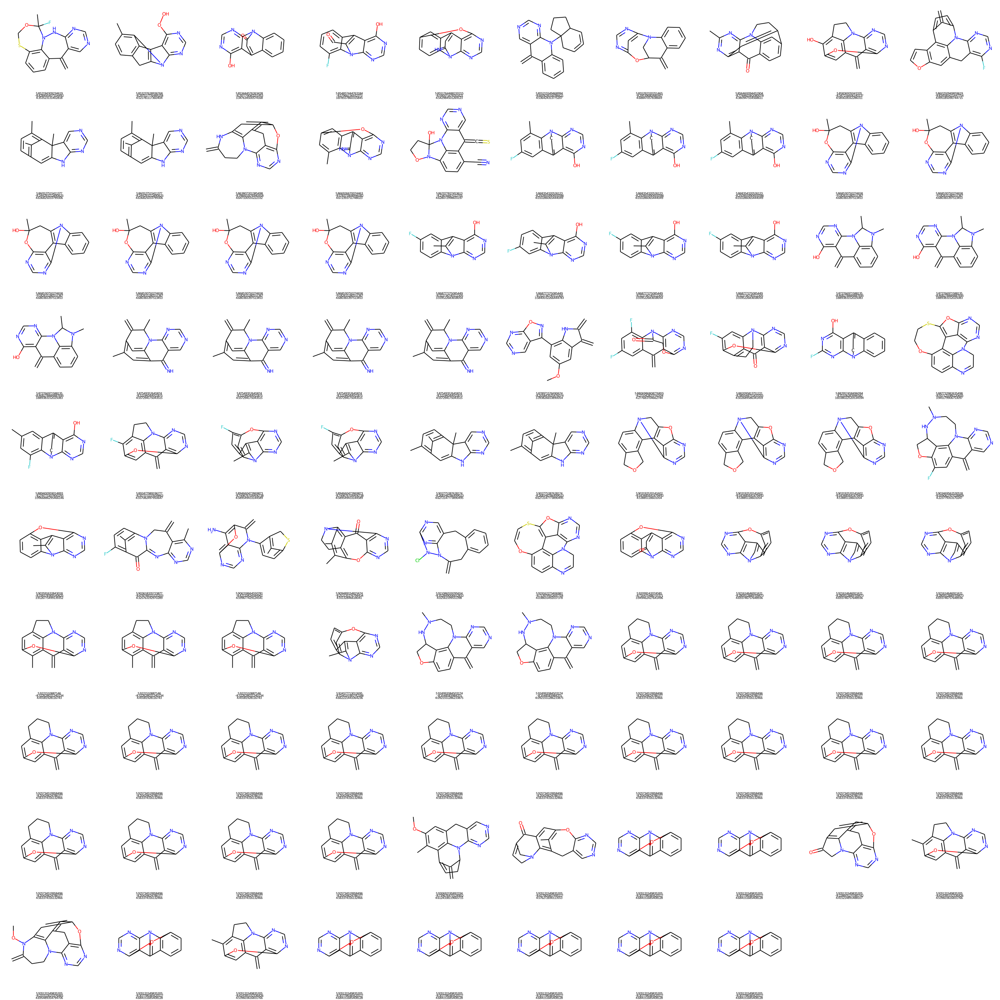

In [23]:
SAmols = []

legends = []

count = 0
for i in range(len(SAscores)):
    if(SAscores[i] < 4.7 and smilesCNS[i] > 5.85 and smilesVINA[i] < -8.2):
        count += 1
        flag = Chem.SanitizeMol(smilesmols[i], catchErrors=True)
        if flag == Chem.SanitizeFlags.SANITIZE_NONE:
            SAmols.append(smilesmols[i])
            legends.append(str(smilesCNS[i]) + "\n" + str(smilesVINA[i]) + "\n" + str(SAscores[i]))
print(count)
print(len(SAmols))

Chem.Draw.MolsToGridImage(SAmols, molsPerRow=10, subImgSize=[300, 300], legends=legends, maxMols=1000)